In [35]:
import supy as sp
import pandas as pd
import matplotlib.pyplot as plt
import contextily as cx
import numpy as np
from matplotlib import cm
import seaborn as sns
import geopandas as gpd
from matplotlib.colors import LinearSegmentedColormap

sp.show_version()

SuPy version: 2024.12.3.dev
-------------


In [2]:
def parse_nml_to_dict(nml_file):
    with open(nml_file, 'r') as file:
        nml_content = file.read()
    
    lines = nml_content.split('\n')
    nml_dict = {}
    current_section = None

    for line in lines:
        line = line.strip()
        if not line or line.startswith('/'):
            continue
        if line.startswith('&'):
            current_section = line[1:]
            nml_dict[current_section] = {}
        elif '=' in line:
            key, value = line.split('=', 1)
            key = key.strip()
            value = value.strip().rstrip(',')
            values = [float(v) if '.' in v else int(v) for v in value.split(',')]
            nml_dict[current_section][key] = values

    return nml_dict

def process_in_chunks(df_state_init, df_forcing, chunk_size=5):
    df_output_list = []
    df_state_final_list = []
    
    # Calculate the number of chunks needed
    num_iterations = (len(df_state_init) + chunk_size - 1) // chunk_size
    print(num_iterations)

    for i in range(num_iterations):
        start_idx = i * chunk_size
        end_idx = start_idx + chunk_size
        df_chunk = df_state_init.iloc[start_idx:end_idx]
        
        df_output, df_state_final = sp.run_supy(df_forcing, df_chunk)
        df_output_list.append(df_output)
        df_state_final_list.append(df_state_final)
    
    # Concatenate all chunks
    df_output_merge = pd.concat(df_output_list)
    df_state_final_merge = pd.concat(df_state_final_list)
    
    return df_output_merge, df_state_final_merge

In [4]:
# def process_in_chunks(df_state_init, df_f, chunk_size=5):
#     df_output_list = []
#     df_state_final_list = []

#     list(set(df_f.index.month))
#     # Calculate the number of chunks needed
#     num_iterations = (len(df_state_init) + chunk_size - 1) // chunk_size
#     print(num_iterations)

#     for i in range(num_iterations):
#         start_idx = i * chunk_size
#         end_idx = start_idx + chunk_size
#         df_chunk = df_state_init.iloc[start_idx:end_idx]

#         for month in list(set(df_f.index.month)):
#             print(f'{list(set(df_f.index.year))[0]}-{month}')
#             df_output, df_state_final = sp.run_supy(df_forcing.loc[f'{list(set(df_f.index.year))[0]}-{month}'], df_chunk)
#             df_output_list.append(df_output)
#             df_state_final_list.append(df_state_final)
        
#     # Concatenate all chunks
#     df_output_merge = pd.concat(df_output_list)
#     df_state_final_merge = pd.concat(df_state_final_list)
        
#     return df_output_merge, df_state_final_merge

# def process_in_chunks(df_state_init, df_f, chunk_size=5):
#     df_output_list = []
#     df_state_final_list = []

#     # Calculate the number of chunks needed
#     num_iterations = (len(df_state_init) + chunk_size - 1) // chunk_size
#     print(f'Number of iterations: {num_iterations}')

#     for i in range(num_iterations):
#         start_idx = i * chunk_size
#         end_idx = start_idx + chunk_size
#         df_chunk = df_state_init.iloc[start_idx:end_idx]
#         print(f'Processing chunk {i+1}/{num_iterations}, rows {start_idx} to {end_idx}')

#         for month in list(set(df_f.index.month)):
#             print(f'Processing month: {list(set(df_f.index.year))[0]}-{month}')
#             a = df_f.loc[f'{list(set(df_f.index.year))[0]}-{month}']
#             df_output, df_state_final = sp.run_supy(a, df_chunk)
#             df_output_list.append(df_output)
#             df_state_final_list.append(df_state_final)
        
#     # Concatenate all chunks
#     if df_output_list and df_state_final_list:
#         df_output_merge = pd.concat(df_output_list)
#         df_state_final_merge = pd.concat(df_state_final_list)
#         return df_output_merge, df_state_final_merge
#     else:
#         print('No data to concatenate')
#         return None, None


for month in ['11','12']:
    df_output_2017, df_final_state_2017 = process_in_chunks(data, df_forcing.loc[f'2017-{month}'], chunk_size = 1)

15
2025-02-28 10:13:43,929 - SuPy - INFO - ====================
2025-02-28 10:13:43,934 - SuPy - INFO - Simulation period:
2025-02-28 10:13:43,934 - SuPy - INFO -   Start: 2017-11-01 00:00:00
2025-02-28 10:13:43,934 - SuPy - INFO -   End: 2017-11-30 23:00:00
2025-02-28 10:13:43,934 - SuPy - INFO - 
2025-02-28 10:13:43,939 - SuPy - INFO - No. of grids: 1
2025-02-28 10:13:43,940 - SuPy - INFO - SuPy is running in serial mode


: 

In [13]:

df_output_2017, df_final_state_2017 = process_in_chunks(data, df_forcing.loc['2017-11-01': '2017-12-31'], chunk_size = 5)

Number of iterations: 3
Processing chunk 1/3, rows 0 to 5
Processing month: 2017-11
2025-02-28 10:11:55,012 - SuPy - INFO - ====================
2025-02-28 10:11:55,013 - SuPy - INFO - Simulation period:
2025-02-28 10:11:55,015 - SuPy - INFO -   Start: 2017-11-01 00:00:00
2025-02-28 10:11:55,016 - SuPy - INFO -   End: 2017-11-30 23:00:00
2025-02-28 10:11:55,017 - SuPy - INFO - 
2025-02-28 10:11:55,017 - SuPy - INFO - No. of grids: 5
2025-02-28 10:11:55,019 - SuPy - INFO - SuPy is running in serial mode


: 

In [253]:
yaml ='C:/GitHub/SUEWS_DB_Typology_test/yaml/friday3.yml'
config = sp.data_model.init_config_from_yaml(yaml)
df_state = config.to_df_state()
met_path = str(config.model.control.forcing_file)
df_forcing = sp._load.load_SUEWS_Forcing_met_df_yaml(met_path)

data = df_state.copy()
data.loc[:, 'netradiationmethod'] = 1003 # Spartacus
data.loc[:, 'storageheatmethod'] = 1
data.loc[:, 'roughlenmommethod'] = 3
data.loc[:, 'roughlenheatmethod'] = 3
data.loc[:, 'stabilitymethod'] = 3

data.loc[:, 'ohmincqf'] = 0 # QN


2025-02-28 13:00:50,069 - SuPy - WARNING - Input is not a yaml file, loading from other sources. These methods will be deprecated in later versions.


In [35]:
data = data.loc[[1,2,3]]

In [68]:
df_output_list = []
df_temp_list = []
df_state_final_list = []
df_state_temp_list = []
chunk_size = 1
# Calculate the number of chunks needed
num_iterations = (len(data) + chunk_size - 1) // chunk_size
print(num_iterations)

for i in range(num_iterations):
    start_idx = i * chunk_size
    end_idx = start_idx + chunk_size
    df_chunk = data.iloc[start_idx:end_idx]

    for i in ['2017-07']:
        df_output, df_state_final = sp.run_supy(df_forcing.loc[month],df_chunk)
        
        df_temp_list.append(df_output.reset_index().set_index(['grid']))
        df_state_temp_list.append(df_state_final.reset_index().set_index(['grid']))

    df_output_m = pd.concat(df_temp_list)
    df_state_final_m = pd.concat(df_state_temp_list)
    
    df_output_list.append(df_output_m)
    df_state_final_list.append(df_state_final_m)

# Concatenate all chunks
df_output_merge = pd.concat(df_output_list)
df_state_final_merge = pd.concat(df_state_final_list)




3
2025-02-28 10:35:23,462 - SuPy - INFO - ====================
2025-02-28 10:35:23,464 - SuPy - INFO - Simulation period:
2025-02-28 10:35:23,464 - SuPy - INFO -   Start: 2017-07-01 00:00:00
2025-02-28 10:35:23,466 - SuPy - INFO -   End: 2017-07-31 23:00:00
2025-02-28 10:35:23,466 - SuPy - INFO - 
2025-02-28 10:35:23,467 - SuPy - INFO - No. of grids: 1
2025-02-28 10:35:23,469 - SuPy - INFO - SuPy is running in serial mode
2025-02-28 10:35:24,377 - SuPy - INFO - Execution time: 0.9 s
2025-02-28 10:35:24,377 - SuPy - INFO - ====================

2025-02-28 10:35:24,377 - SuPy - INFO - ====================
2025-02-28 10:35:24,377 - SuPy - INFO - Simulation period:
2025-02-28 10:35:24,392 - SuPy - INFO -   Start: 2017-07-01 00:00:00
2025-02-28 10:35:24,392 - SuPy - INFO -   End: 2017-07-31 23:00:00
2025-02-28 10:35:24,392 - SuPy - INFO - 
2025-02-28 10:35:24,392 - SuPy - INFO - No. of grids: 1
2025-02-28 10:35:24,392 - SuPy - INFO - SuPy is running in serial mode
2025-02-28 10:35:25,277 - 

In [70]:
df_output_merge.SUEWS

var,Kdown,Kup,Ldown,Lup,Tsurf,QN,QF,QS,QH,QE,...,MeltWater,MeltWStore,SnowCh,SnowRPaved,SnowRBldgs,Ts,T2,Q2,U10,RH2
grid,,,,,,,,,,,,,,,,,,,,,
1,0.00,0.000000,360.294916,397.229231,16.600000,-36.934315,7.325223,-28.573132,-1.959408,0.923447,...,0.0,0.0,0.0,0.0,0.0,16.407494,16.472999,8.548055,0.259926,72.887331
1,0.08,0.012734,360.294916,397.234612,16.601041,-36.872430,5.860178,-26.898912,-4.115331,0.001991,...,0.0,0.0,0.0,0.0,0.0,16.195720,15.742714,8.511734,0.116524,76.051607
1,0.69,0.109834,356.188400,393.924696,16.009031,-37.156131,4.395134,-25.869596,-6.907041,0.015640,...,0.0,0.0,0.0,0.0,0.0,15.322743,14.563859,8.191550,0.125488,78.980721
1,15.14,2.409987,346.814023,392.768940,15.898571,-33.224904,4.395134,-24.258775,-4.923510,0.352515,...,0.0,0.0,0.0,0.0,0.0,15.217430,15.387154,7.373405,0.364036,67.459983
1,92.68,14.752813,346.831978,403.653826,17.995602,21.105339,5.860178,-6.075979,30.385378,2.656118,...,0.0,0.0,0.0,0.0,0.0,19.790223,17.463615,7.211647,0.638832,57.805189
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3,32.82,5.502647,374.642271,408.773651,18.719729,-6.814026,34.084881,-31.475542,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,1.335495,NaN
3,4.70,0.788008,381.569961,406.899021,18.260281,-21.417069,30.676393,-29.892406,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,1.573976,NaN
3,0.01,0.001677,380.468118,402.883951,17.500129,-22.407509,27.267904,-27.174170,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,1.144710,NaN


In [44]:
df_output_merge

group                          BEERS                                   \
var                          azimuth   altitude GlobalRad  DiffuseRad   
grid datetime                                                           
1    2017-07-01 00:00:00   10.240924  -8.666585      0.00    0.000000   
     2017-07-01 01:00:00   23.933706  -6.296408      0.08    0.000000   
     2017-07-01 02:00:00   37.145896  -1.439604      0.69    0.000000   
     2017-07-01 03:00:00   49.789284   3.544104     15.14    9.440345   
     2017-07-01 04:00:00   61.965770  10.036673     92.68  158.658709   
...                              ...        ...       ...         ...   
3    2017-07-31 19:00:00  300.776780   3.035928     32.82  267.608065   
     2017-07-31 20:00:00  313.511526  -3.283103      4.70    0.000000   
     2017-07-31 21:00:00  326.873667  -8.804904      0.01    0.000000   
     2017-07-31 22:00:00  340.900744 -12.324377      0.00    0.000000   
     2017-07-31 23:00:00  355.427181 -13.971015      0.00    0.000000   

group                                                                 \
var                       DirectRad    Kdown2d      Kup2d     Ksouth   
grid datetime                                                          
1    2017-07-01 00:00:00   0.000000   0.000000   0.000000   0.000000   
     2017-07-01 01:00:00   0.000000   0.000000   0.000000   0.000000   
     2017-07-01 02:00:00   0.000000   0.000000   0.000000   0.000000   
     2017-07-01 03:00:00  14.556428  14.375511   2.236463   5.567436   
     2017-07-01 04:00:00  65.029201  89.409401  10.302278  25.320297   
...                             ...        ...        ...        ...   
3    2017-07-31 19:00:00  18.646902  32.160801   2.968395   8.325398   
     2017-07-31 20:00:00   0.000000   0.000000   0.000000   0.000000   
     2017-07-31 21:00:00   0.000000   0.000000   0.000000   0.000000   
     2017-07-31 22:00:00   0.000000   0.000000   0.000000   0.000000   
     2017-07-31 23:00:00   0.000000   0.000000   0.000000   0.000000   

group                                           ...     SUEWS             \
var                           Kwest     Knorth  ... MeltWater MeltWStore   
grid datetime                                   ...                        
1    2017-07-01 00:00:00   0.000000   0.000000  ...       0.0        0.0   
     2017-07-01 01:00:00   0.000000   0.000000  ...       0.0        0.0   
     2017-07-01 02:00:00   0.000000   0.000000  ...       0.0        0.0   
     2017-07-01 03:00:00   5.567436   5.567436  ...       0.0        0.0   
     2017-07-01 04:00:00  25.320297  28.859408  ...       0.0        0.0   
...                             ...        ...  ...       ...        ...   
3    2017-07-31 19:00:00   8.325398   8.325398  ...       0.0        0.0   
     2017-07-31 20:00:00   0.000000   0.000000  ...       0.0        0.0   
     2017-07-31 21:00:00   0.000000   0.000000  ...       0.0        0.0   
     2017-07-31 22:00:00   0.000000   0.000000  ...       0.0        0.0   
     2017-07-31 23:00:00   0.000000   0.000000  ...       0.0        0.0   

group                                                                        \
var                      SnowCh SnowRPaved SnowRBldgs         Ts         T2   
grid datetime                                                                 
1    2017-07-01 00:00:00    0.0        0.0        0.0  16.407494  16.472999   
     2017-07-01 01:00:00    0.0        0.0        0.0  16.195720  15.742714   
     2017-07-01 02:00:00    0.0        0.0        0.0  15.322743  14.563859   
     2017-07-01 03:00:00    0.0        0.0        0.0  15.217430  15.387154   
     2017-07-01 04:00:00    0.0        0.0        0.0  19.790223  17.463615   
...                         ...        ...        ...        ...        ...   
3    2017-07-31 19:00:00    0.0        0.0        0.0        NaN        NaN   
     2017-07-31 20:00:00    0.0        0.0        0.0        NaN        NaN   
     2017-07-31 21:00:00    0.0   

In [9]:
infolder = 'C:/GitHub/SUEWS_DB_Typology_test/data/noehc/'

scenario = 'all_typo'
rc = infolder + 'RunControl_' + scenario + '.nml'
sel = infolder  + scenario + '/'

# df_state_init = sp.init_supy(rc)
# grid_list = (df_state_init.index)

df_forcing = sp.load_forcing_grid(rc, 1)
df_forcing['U'] = df_forcing['U'].apply(lambda x: x if x >= 0.5 else 0.5)

p2s = '2018-06-28'
p2e = '2018-07-05'

2025-02-28 13:22:37,024 - SuPy - INFO - All cache cleared.


2025-02-27 16:02:05,254 - SuPy - WARNING - Input is not a yaml file, loading from other sources. These methods will be deprecated in later versions.


In [4]:
data = df_state_init.copy()

# Function for reading GridLayoutFiles
for grid in grid_list:

    gridlayout_nml = sel + 'GridLayouttypo' + str(grid) + '.nml'
    SS_dict = parse_nml_to_dict(gridlayout_nml)

    var = 'building_frac'
    data.loc[grid, (var, '(0,)')] = SS_dict['geom'][var][0]
    data.loc[grid, (var, '(1,)')] = SS_dict['geom'][var][1]
    data.loc[grid, (var, '(2,)')] = SS_dict['geom'][var][2]
    
    var = 'height'
    data.loc[grid, (var, '(0,)')] = SS_dict['geom'][var][0]
    data.loc[grid, (var, '(1,)')] = SS_dict['geom'][var][1]
    data.loc[grid, (var, '(2,)')] = SS_dict['geom'][var][2]
    data.loc[grid, (var, '(3,)')] = SS_dict['geom'][var][3]
    
    var = 'building_scale'
    data.loc[grid, (var, '(0,)')] = SS_dict['geom'][var][0]
    data.loc[grid, (var, '(1,)')] = SS_dict['geom'][var][1]
    data.loc[grid, (var, '(2,)')] = SS_dict['geom'][var][2]

    var = 'veg_frac'
    data.loc[grid, (var, '(0,)')] = SS_dict['geom'][var][0]
    data.loc[grid, (var, '(1,)')] = SS_dict['geom'][var][1]
    data.loc[grid, (var, '(2,)')] = SS_dict['geom'][var][2]

    var = 'veg_scale'
    data.loc[grid, (var, '(0,)')] = SS_dict['geom'][var][0]
    data.loc[grid, (var, '(1,)')] = SS_dict['geom'][var][1]
    data.loc[grid, (var, '(2,)')] = SS_dict['geom'][var][2]

    #############################   Roof ###############################
    for surf in ['roof', 'wall']:
    
        for var in ['sfr','tin', 'alb','emis']:
            var_surf = var + '_' + surf 
            data.loc[grid, (var_surf, '(0,)')] = SS_dict[surf][var_surf][0]
            data.loc[grid, (var_surf, '(1,)')] = SS_dict[surf][var_surf][1]
            data.loc[grid, (var_surf, '(2,)')] = SS_dict[surf][var_surf][2]

        for vlayer in [0,1,2]:
            for hlayer in [0,1,2,3,4]:
                # Vertical Layer 1
                var = 'dz_' + surf
                data.loc[grid,(var, f'({vlayer}, {hlayer})')] = SS_dict[surf][f'{var}({vlayer+1},:)'][hlayer]
                var = 'k_' + surf
                data.loc[grid,(var, f'({vlayer}, {hlayer})')] = SS_dict[surf][f'{var}({vlayer+1},:)'][hlayer]
                var = 'cp_' + surf
                data.loc[grid,(var, f'({vlayer}, {hlayer})')] = SS_dict[surf][f'{var}({vlayer+1},:)'][hlayer]



In [3]:
yaml ='C:/GitHub/SUEWS_DB_Typology_test/yaml/friday3.yml'
config = sp.data_model.init_config_from_yaml(yaml)
df_state = config.to_df_state()
met_path = str(config.model.control.forcing_file)
df_forcing = sp._load.load_SUEWS_Forcing_met_df_yaml(met_path)

data = df_state.copy()
data.loc[:, 'netradiationmethod'] = 3 # Spartacus
data.loc[:, 'storageheatmethod'] = 1
data.loc[:, 'roughlenmommethod'] = 3
data.loc[:, 'roughlenheatmethod'] = 3
data.loc[:, 'stabilitymethod'] = 3

data.loc[:, 'ohmincqf'] = 0 # QN
# df_output_2017, df_final_state_2017 = process_in_chunks(data, df_forcing.loc['2017-11-01': '2017-12-31'], chunk_size = 5)

2025-02-28 09:58:27,928 - SuPy - WARNING - Input is not a yaml file, loading from other sources. These methods will be deprecated in later versions.


In [16]:
df_output_2017, df_final_state_2017 = process_in_chunks(data, df_forcing.loc['2017-11-01': '2017-12-31'], chunk_size = 5)

3
2025-02-28 10:03:04,664 - SuPy - INFO - ====================
2025-02-28 10:03:04,665 - SuPy - INFO - Simulation period:
2025-02-28 10:03:04,667 - SuPy - INFO -   Start: 2017-11-01 00:00:00
2025-02-28 10:03:04,667 - SuPy - INFO -   End: 2017-11-30 23:00:00
2025-02-28 10:03:04,667 - SuPy - INFO - 
2025-02-28 10:03:04,667 - SuPy - INFO - No. of grids: 5
2025-02-28 10:03:04,667 - SuPy - INFO - SuPy is running in serial mode


: 

In [6]:

data = df_state.copy()
data.loc[:, 'netradiationmethod'] = 3 # Spartacus
data.loc[:, 'storageheatmethod'] = 1
data.loc[:, 'roughlenmommethod'] = 3
data.loc[:, 'roughlenheatmethod'] = 3
data.loc[:, 'stabilitymethod'] = 3

data.loc[:, 'ohmincqf'] = 0 # QN
df_output_2017, df_final_state_2017 = process_in_chunks(data, df_forcing.loc['2017-07-01': '2017-07-31'], chunk_size = 5)

3
2025-02-28 09:40:30,056 - SuPy - INFO - ====================
2025-02-28 09:40:30,056 - SuPy - INFO - Simulation period:
2025-02-28 09:40:30,056 - SuPy - INFO -   Start: 2017-07-01 00:00:00
2025-02-28 09:40:30,056 - SuPy - INFO -   End: 2017-07-31 23:00:00
2025-02-28 09:40:30,056 - SuPy - INFO - 
2025-02-28 09:40:30,056 - SuPy - INFO - No. of grids: 5
2025-02-28 09:40:30,056 - SuPy - INFO - SuPy is running in serial mode
2025-02-28 09:40:34,419 - SuPy - INFO - Execution time: 4.4 s
2025-02-28 09:40:34,419 - SuPy - INFO - ====================

2025-02-28 09:40:34,419 - SuPy - INFO - ====================
2025-02-28 09:40:34,419 - SuPy - INFO - Simulation period:
2025-02-28 09:40:34,419 - SuPy - INFO -   Start: 2017-07-01 00:00:00
2025-02-28 09:40:34,419 - SuPy - INFO -   End: 2017-07-31 23:00:00
2025-02-28 09:40:34,419 - SuPy - INFO - 
2025-02-28 09:40:34,419 - SuPy - INFO - No. of grids: 5
2025-02-28 09:40:34,435 - SuPy - INFO - SuPy is running in serial mode
2025-02-28 09:40:38,637 - 

<Axes: xlabel='grid,datetime'>

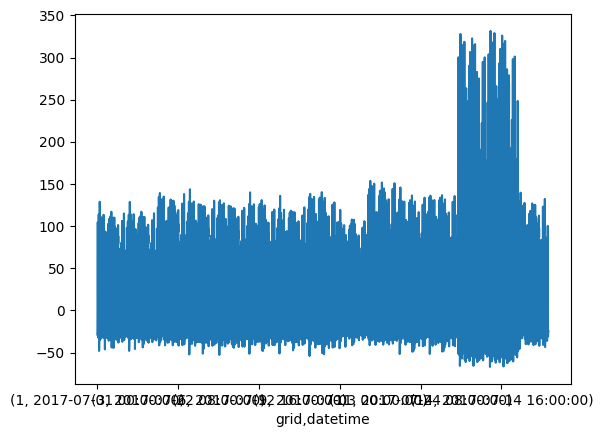

In [145]:
p2s = '2018-06-28'
p2e = '2018-07-05'
# Start date
start_date = '2018-01-01 00:00:00'
# p2
df_final_state_2017.loc[:, 'ohmincqf'] = 0 # QN
df_output_2017, df_state_spinup_alltypo = process_in_chunks(df_final_state_2017.loc[start_date], df_forcing.loc[start_date: p2s], chunk_size = 3)


In [ ]:
sp.save_supy(df_output_2017.loc[1], df_state_spinup_alltypo, path_dir_save= sel + '/Output')

In [8]:
p2s = '2018-06-28'
p2e = '2018-07-05'
# Start date
start_date = '2018-01-01 00:00:00'

# infolder = 'C:/GitHub/SUEWS_DB_Typology_test/data/noehc/'


met_path = str('C:/GitHub/SUEWS_DB_Typology_test/yaml/met_2017_data_60.txt')
df_forcing = sp._load.load_SUEWS_Forcing_met_df_yaml(met_path)
yaml_dir ='C:/GitHub/SUEWS_DB_Typology_test/yaml/'


df_forcing['U'] = df_forcing['U'].apply(lambda x: x if x >= 0.5 else 0.5)

for scenario in ['friday3', 'friday3notypo']:

    yaml = yaml_dir + scenario + '.yml'
    sel = yaml + scenario + '/'
    config = sp.data_model.init_config_from_yaml(yaml)
    df_state_init = config.to_df_state()
    grid_list = (df_state_init.index)

    data = df_state_init.copy()

    # # Function for reading GridLayoutFiles
    # for grid in grid_list:

    #     gridlayout_nml = sel + 'GridLayouttypo' + str(grid) + '.nml'
    #     SS_dict = parse_nml_to_dict(gridlayout_nml)

    #     var = 'building_frac'
    #     data.loc[grid, (var, '(0,)')] = SS_dict['geom'][var][0]
    #     data.loc[grid, (var, '(1,)')] = SS_dict['geom'][var][1]
    #     data.loc[grid, (var, '(2,)')] = SS_dict['geom'][var][2]
        
    #     var = 'height'
    #     data.loc[grid, (var, '(0,)')] = SS_dict['geom'][var][0]
    #     data.loc[grid, (var, '(1,)')] = SS_dict['geom'][var][1]
    #     data.loc[grid, (var, '(2,)')] = SS_dict['geom'][var][2]
    #     data.loc[grid, (var, '(3,)')] = SS_dict['geom'][var][3]
        
    #     var = 'building_scale'
    #     data.loc[grid, (var, '(0,)')] = SS_dict['geom'][var][0]
    #     data.loc[grid, (var, '(1,)')] = SS_dict['geom'][var][1]
    #     data.loc[grid, (var, '(2,)')] = SS_dict['geom'][var][2]

    #     var = 'veg_frac'
    #     data.loc[grid, (var, '(0,)')] = SS_dict['geom'][var][0]
    #     data.loc[grid, (var, '(1,)')] = SS_dict['geom'][var][1]
    #     data.loc[grid, (var, '(2,)')] = SS_dict['geom'][var][2]

    #     var = 'veg_scale'
    #     data.loc[grid, (var, '(0,)')] = SS_dict['geom'][var][0]
    #     data.loc[grid, (var, '(1,)')] = SS_dict['geom'][var][1]
    #     data.loc[grid, (var, '(2,)')] = SS_dict['geom'][var][2]

    #     #############################   Roof ###############################
    #     for surf in ['roof', 'wall']:
        
    #         for var in ['sfr','tin', 'alb','emis']:
    #             var_surf = var + '_' + surf 
    #             data.loc[grid, (var_surf, '(0,)')] = SS_dict[surf][var_surf][0]
    #             data.loc[grid, (var_surf, '(1,)')] = SS_dict[surf][var_surf][1]
    #             data.loc[grid, (var_surf, '(2,)')] = SS_dict[surf][var_surf][2]

    #         for vlayer in [0,1,2]:
    #             for hlayer in [0,1,2,3,4]:
    #                 # Vertical Layer 1
    #                 var = 'dz_' + surf
    #                 data.loc[grid,(var, f'({vlayer}, {hlayer})')] = SS_dict[surf][f'{var}({vlayer+1},:)'][hlayer]
    #                 var = 'k_' + surf
    #                 data.loc[grid,(var, f'({vlayer}, {hlayer})')] = SS_dict[surf][f'{var}({vlayer+1},:)'][hlayer]
    #                 var = 'cp_' + surf
    #                 data.loc[grid,(var, f'({vlayer}, {hlayer})')] = SS_dict[surf][f'{var}({vlayer+1},:)'][hlayer]

    data.loc[:, 'netradiationmethod'] = 3 # Spartacus
    data.loc[:, 'storageheatmethod'] = 1
    data.loc[:, 'roughlenmommethod'] = 3
    data.loc[:, 'roughlenheatmethod'] = 3
    data.loc[:, 'stabilitymethod'] = 3

    df_output_2017, df_final_state_2017 = process_in_chunks(data, df_forcing.loc['2017-01-01': '2017-12-31'], chunk_size = 2)

    df_output_2017, df_state_spinup_alltypo = process_in_chunks(df_final_state_2017.loc[start_date], df_forcing.loc[start_date: p2s], chunk_size = 2)
#
    sp.save_supy(df_output_2017, df_state_spinup_alltypo, path_dir_save= sel)

2025-02-28 09:41:58,195 - SuPy - WARNING - Input is not a yaml file, loading from other sources. These methods will be deprecated in later versions.
8
2025-02-28 09:42:01,219 - SuPy - INFO - ====================
2025-02-28 09:42:01,219 - SuPy - INFO - Simulation period:
2025-02-28 09:42:01,219 - SuPy - INFO -   Start: 2017-01-01 00:00:00
2025-02-28 09:42:01,226 - SuPy - INFO -   End: 2017-12-31 23:00:00
2025-02-28 09:42:01,226 - SuPy - INFO - 
2025-02-28 09:42:01,226 - SuPy - INFO - No. of grids: 2
2025-02-28 09:42:01,226 - SuPy - INFO - SuPy is running in serial mode


: 

In [4]:
    sp.save_supy(df_output_2017, df_state_spinup_alltypo, path_dir_save= sel + '/Output')


[WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/Output/1_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/Output/2_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/Output/3_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/Output/4_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/Output/5_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/Output/6_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/Output/7_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/Output/8_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/Output/9_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/Output/10_2018_DailyState.txt'),
 WindowsPath('C:/Gi

# Read spinup-states

In [7]:
pathdir = r'C:\GitHub\SUEWS_DB_Typology_test\data\noehc'
state_no_typo = sp.init_supy( pathdir + '/no_typo/SSOutput/df_state.csv')
state_no_typo = state_no_typo.loc['2018-06-28']

state_all_typo = sp.init_supy( pathdir + '/all_typo/SSOutput/df_state.csv')
state_all_typo = state_all_typo.loc['2018-06-28']

state_no_typo

var     age_0_4 age_12_18 age_19_64 age_5_11 age_65plus ah_min         \
ind_dim       0         0         0        0          0   (0,)   (1,)   
grid                                                                    
1           0.0       0.0       0.0      0.0        0.0 -999.0 -999.0   
2           0.0       0.0       0.0      0.0        0.0 -999.0 -999.0   
3           0.0       0.0       0.0      0.0        0.0 -999.0 -999.0   
4           0.0       0.0       0.0      0.0        0.0 -999.0 -999.0   
5           0.0       0.0       0.0      0.0        0.0 -999.0 -999.0   
6           0.0       0.0       0.0      0.0        0.0 -999.0 -999.0   
7           0.0       0.0       0.0      0.0        0.0 -999.0 -999.0   
8           0.0       0.0       0.0      0.0        0.0 -999.0 -999.0   
9           0.0       0.0       0.0      0.0        0.0 -999.0 -999.0   
10          0.0       0.0       0.0      0.0        0.0 -999.0 -999.0   
11          0.0       0.0       0.0      0.0        0.0 -999.0 -999.0   
12          0.0       0.0       0.0      0.0        0.0 -999.0 -999.0   
13          0.0       0.0       0.0      0.0        0.0 -999.0 -999.0   
14          0.0       0.0       0.0      0.0        0.0 -999.0 -999.0   
15          0.0       0.0       0.0      0.0        0.0 -999.0 -999.0   

var     ah_slope_cooling        ah_slope_heating  ... wuprofm_24hr          \
ind_dim             (0,)   (1,)             (0,)  ...      (21, 0) (21, 1)   
grid                                              ...                        
1                 -999.0 -999.0           -999.0  ...         0.03    0.04   
2                 -999.0 -999.0           -999.0  ...         0.03    0.04   
3                 -999.0 -999.0           -999.0  ...         0.03    0.04   
4                 -999.0 -999.0           -999.0  ...         0.03    0.04   
5                 -999.0 -999.0           -999.0  ...         0.03    0.04   
6                 -999.0 -999.0           -999.0  ...         0.03    0.04   
7                 -999.0 -999.0           -999.0  ...         0.03    0.04   
8                 -999.0 -999.0           -999.0  ...         0.03    0.04   
9                 -999.0 -999.0           -999.0  ...         0.03    0.04   
10                -999.0 -999.0           -999.0  ...         0.03    0.04   
11                -999.0 -999.0           -999.0  ...         0.03    0.04   
12                -999.0 -999.0           -999.0  ...         0.03    0.04   
13                -999.0 -999.0           -999.0  ...         0.03    0.04   
14                -999.0 -999.0           -999.0  ...         0.03    0.04   
15                -999.0 -999.0           -999.0  ...         0.03    0.04   

var                                      wwr       z z0m_in  zdm_in  
ind_dim (22, 0) (22, 1) (23, 0) (23, 1)    0       0      0       0  
grid                                                                 
1          0.03    0.04    0.03    0.04  0.2  21.599  0.242   7.872  
2          0.03    0.04    0.03    0.04  0.2  30.653  0.436  10.726  
3          0.03    0.04    0.03    0.04  0.2  24.047  0.640   7.093  
4          0.03    0.04    0.03    0.04  0.2  21.511  0.410   7.271  
5          0.03    0.04    0.03    0.04  0.2  30.812  0.808  10.087  
6          0.03    0.04    0.03    0.04  0.2  37.913  1.067  12.352  
7          0.03    0.04    0.03    0.04  0.2  20.675  0.324   7.198  
8          0.03    0.04    0.03    0.04  0.2  30.621  0.608   9.766  
9          0.03    0.04    0.03    0.04  0.2  32.740  0.356  12.706  
10         0.03    0.04    0.03    0.04  0.2  21.823  0.238   7.131  
11         0.03    0.04    0.03    0.04  0.2  45.919  1.168  15.605  
12         0.03    0.04    0.03    0.04  0.2  30.916  0.487  10.859  
13         0.03    0.04    0.03    0.04  0.2  21.141  0.224   6.614  
14         0.03    0.04    0.03    0.04  0.2  20.090  0.154   6.435  
15         0.03    0.04    0.03    0.04  0.2  29.518  1.032   8.003  

[15 rows x 1403 col

In [25]:
state_all_typo.loc[:, 'netradiationmethod'] = 3
state_all_typo.loc[:, 'ohmincqf'] = 1
state_no_typo.loc[:, 'netradiationmethod'] = 3
state_no_typo.loc[:, 'ohmincqf'] = 1
# SpartacusOHM

df_notypo_s, df_final_state_motypo = process_in_chunks(state_no_typo, df_forcing.loc[p2s: p2e], chunk_size = 3)
df_suews_notypo = df_notypo_s.SUEWS


df_alltypo_s, df_final_state_motypo = process_in_chunks(state_all_typo, df_forcing.loc[p2s: p2e], chunk_size = 3)
df_suews_alltypo = df_alltypo_s.SUEWS


5
2025-02-28 15:11:07,159 - SuPy - INFO - ====================
2025-02-28 15:11:07,160 - SuPy - INFO - Simulation period:
2025-02-28 15:11:07,160 - SuPy - INFO -   Start: 2018-06-28 00:00:00
2025-02-28 15:11:07,161 - SuPy - INFO -   End: 2018-07-05 23:55:00
2025-02-28 15:11:07,162 - SuPy - INFO - 
2025-02-28 15:11:07,163 - SuPy - INFO - No. of grids: 3
2025-02-28 15:11:07,164 - SuPy - INFO - SuPy is running in serial mode
2025-02-28 15:11:11,172 - SuPy - INFO - Execution time: 4.0 s
2025-02-28 15:11:11,172 - SuPy - INFO - ====================

2025-02-28 15:11:11,172 - SuPy - INFO - ====================
2025-02-28 15:11:11,172 - SuPy - INFO - Simulation period:
2025-02-28 15:11:11,172 - SuPy - INFO -   Start: 2018-06-28 00:00:00
2025-02-28 15:11:11,172 - SuPy - INFO -   End: 2018-07-05 23:55:00
2025-02-28 15:11:11,172 - SuPy - INFO - 
2025-02-28 15:11:11,172 - SuPy - INFO - No. of grids: 3
2025-02-28 15:11:11,172 - SuPy - INFO - SuPy is running in serial mode
2025-02-28 15:11:14,948 - 

In [7]:
# SpartacusOHM
df_alltypo_s, df_final_state_motypo = process_in_chunks(state_all_typo, df_forcing.loc[p2s: p2e], chunk_size = 3)
df_suews_alltypo = df_alltypo_s.SUEWS

5
2025-02-03 16:51:56,743 - SuPy - INFO - ====================
2025-02-03 16:51:56,744 - SuPy - INFO - Simulation period:
2025-02-03 16:51:56,745 - SuPy - INFO -   Start: 2018-06-28 00:00:00
2025-02-03 16:51:56,746 - SuPy - INFO -   End: 2018-07-05 23:55:00
2025-02-03 16:51:56,746 - SuPy - INFO - 
2025-02-03 16:51:56,747 - SuPy - INFO - No. of grids: 3
2025-02-03 16:51:56,748 - SuPy - INFO - SuPy is running in serial mode
2025-02-03 17:09:53,128 - SuPy - INFO - Execution time: 1076.4 s
2025-02-03 17:09:53,128 - SuPy - INFO - ====================

2025-02-03 17:09:53,130 - SuPy - INFO - ====================
2025-02-03 17:09:53,131 - SuPy - INFO - Simulation period:
2025-02-03 17:09:53,131 - SuPy - INFO -   Start: 2018-06-28 00:00:00
2025-02-03 17:09:53,133 - SuPy - INFO -   End: 2018-07-05 23:55:00
2025-02-03 17:09:53,134 - SuPy - INFO - 
2025-02-03 17:09:53,135 - SuPy - INFO - No. of grids: 3
2025-02-03 17:09:53,136 - SuPy - INFO - SuPy is running in serial mode
2025-02-03 17:18:18,313

In [8]:
sp.save_supy(df_alltypo_s, df_final_state_motypo, path_dir_save= 'C:/GitHub/SUEWS_DB_Typology_test/data/noehc/all_typo/SSOutput')
sp.save_supy(df_notypo_s, df_final_state_motypo, path_dir_save= 'C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/SSOutput')


[WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/SSOutput/1_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/SSOutput/2_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/SSOutput/3_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/SSOutput/4_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/SSOutput/5_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/SSOutput/6_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/SSOutput/7_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/SSOutput/8_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/SSOutput/9_2018_DailyState.txt'),
 WindowsPath('C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/SSOutput/10_2018_DailyState.txt'),

In [227]:
df_list = []
grid_list = []
for grid in range(15):
    grid = grid+1

    df = pd.read_csv(f'C:/GitHub/SUEWS_DB_Typology_test/data/noehc/no_typo/SSOutput/{grid}_2018_SUEWS_60.txt', delim_whitespace=True)

    # Convert Year and DOY to datetime
    df['Date'] = pd.to_datetime(df['Year'].astype(str) + df['DOY'].astype(str), format='%Y%j')

    # Add Hour and Min to the Date
    df['Datetime'] = df['Date'] + pd.to_timedelta(df['Hour'], unit='h') + pd.to_timedelta(df['Min'], unit='m')

    # Set Datetime as the index
    df.set_index('Datetime', inplace=True)

    # Drop the intermediate columns if not needed
    df.drop(columns=['Year', 'DOY', 'Hour', 'Min', 'Date'], inplace=True)

    # Add a column for the grid index
    df['Grid'] = grid

    df_list.append(df)
    grid_list.append(grid)

# Concatenate all DataFrames
df_combined = pd.concat(df_list)

# Set multi-level index with 'Grid' and 'Datetime'
df_combined.set_index('Grid', append=True, inplace=True)
df_combined = df_combined.reorder_levels(['Grid', 'Datetime'])

df_suews_notypo = df_combined
# df_suews_alltypo = df_combined


In [ ]:
state_no_typo = sp.init_supy( yaml_dir + 'friday3notypo/df_state.csv')
state_no_typo = state_no_typo.loc['2018-06-29']

state_all_typo = sp.init_supy( yaml_dir + 'friday3/df_state.csv')
state_all_typo = state_all_typo.loc['2018-06-29']

<Axes: xlabel='datetime'>

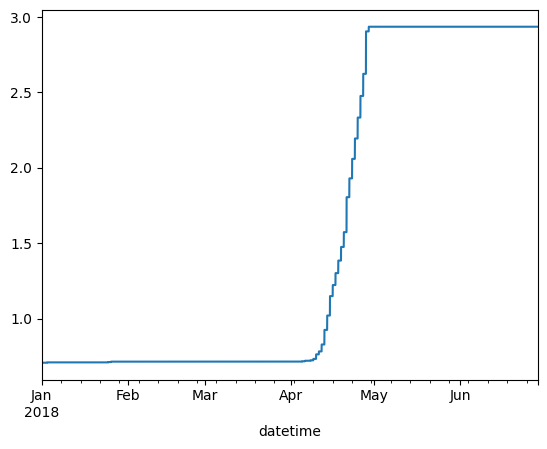

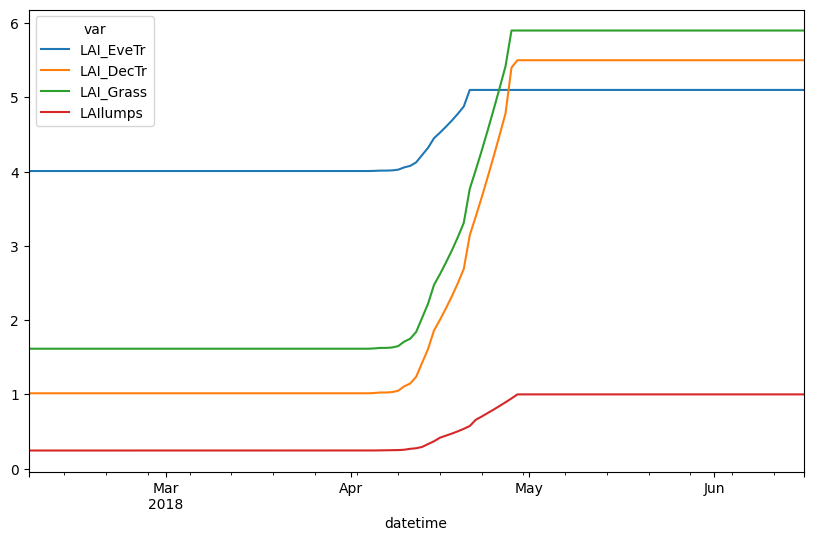

In [51]:

df_output_2017.SUEWS.loc[1,'LAI'].plot()

df_output_2017.DailyState.loc[1].loc['2018 02 05': '2018 06 15'].filter(like="LAI").dropna().plot(figsize=(10,6))

In [22]:
df_suews_alltypo - df_suews_notypo

var                       Kdown  Kup  Ldown  Lup  Tsurf   QN   QF   QS   QH  \
grid datetime                                                                 
1    2018-06-28 00:00:00    0.0  0.0    0.0  0.0    0.0  0.0  0.0  0.0  0.0   
     2018-06-28 00:05:00    0.0  0.0    0.0  0.0    0.0  0.0  0.0  0.0  0.0   
     2018-06-28 00:10:00    0.0  0.0    0.0  0.0    0.0  0.0  0.0  0.0  0.0   
     2018-06-28 00:15:00    0.0  0.0    0.0  0.0    0.0  0.0  0.0  0.0  0.0   
     2018-06-28 00:20:00    0.0  0.0    0.0  0.0    0.0  0.0  0.0  0.0  0.0   
...                         ...  ...    ...  ...    ...  ...  ...  ...  ...   
15   2018-07-05 23:35:00    0.0  0.0    0.0  0.0    0.0  0.0  0.0  0.0  0.0   
     2018-07-05 23:40:00    0.0  0.0    0.0  0.0    0.0  0.0  0.0  0.0  0.0   
     2018-07-05 23:45:00    0.0  0.0    0.0  0.0    0.0  0.0  0.0  0.0  0.0   
     2018-07-05 23:50:00    0.0  0.0    0.0  0.0    0.0  0.0  0.0  0.0  0.0   
     2018-07-05 23:55:00    0.0  0.0    0.0  0.0    0.0  0.0  0.0  0.0  0.0   

var                        QE  ...  MeltWater  MeltWStore  SnowCh  SnowRPaved  \
grid datetime                  ...                                              
1    2018-06-28 00:00:00  0.0  ...        0.0         0.0     0.0         0.0   
     2018-06-28 00:05:00  0.0  ...        0.0         0.0     0.0         0.0   
     2018-06-28 00:10:00  0.0  ...        0.0         0.0     0.0         0.0   
     2018-06-28 00:15:00  0.0  ...        0.0         0.0     0.0         0.0   
     2018-06-28 00:20:00  0.0  ...        0.0         0.0     0.0         0.0   
...                       ...  ...        ...         ...     ...         ...   
15   2018-07-05 23:35:00  0.0  ...        0.0         0.0     0.0         0.0   
     2018-07-05 23:40:00  0.0  ...        0.0         0.0     0.0         0.0   
     2018-07-05 23:45:00  0.0  ...        0.0         0.0     0.0         0.0   
     2018-07-05 23:50:00  0.0  ...        0.0         0.0     0.0         0.0   
     2018-07-05 23:55:00  0.0  ...        0.0         0.0     0.0         0.0   

var                       SnowRBldgs   Ts   T2   Q2  U10  RH2  
grid datetime                                                  
1    2018-06-28 00:00:00         0.0  0.0  0.0  0.0  0.0  0.0  
     2018-06-28 00:05:00         0.0  0.0  0.0  0.0  0.0  0.0  
     2018-06-28 00:10:00         0.0  0.0  0.0  0.0  0.0  0.0  
     2018-06-28 00:15:00         0.0  0.0  0.0  0.0  0.0  0.0  
     2018-06-28 00:20:00         0.0  0.0  0.0  0.0  0.0  0.0  
...                              ...  ...  ...  ...  ...  ...  
15   2018-07-05 23:35:00         0.0  0.0  0.0  0.0  0.0  0.0  
     2018-07-05 23:40:00         0.0  0.0  0.0  0.0  0.0  0.0  
     2018-07-05 23:45:00         0.0  0.0  0.0  0.0  0.0  0.0  
     2018-07-05 23:50:00         0.0  0.0  0.0  0.0  0.0  0.0  
     2018-07-05 23:55:00         0.0  0.0  0.0  0.0  0.0  0.0  

[34560 rows x 82 columns]

In [ ]:

diff

Dectime  Kdown        Kup  Ldown       Lup  \
Grid Datetime                                                          
1    2018-06-28 00:00:00      0.0    0.0        NaN    0.0 -0.000664   
     2018-06-28 01:00:00      0.0    0.0  -0.408345    0.0 -0.001296   
     2018-06-28 02:00:00      0.0    0.0   0.723084    0.0 -0.001318   
     2018-06-28 03:00:00      0.0    0.0  -1.189028    0.0 -0.001293   
     2018-06-28 04:00:00      0.0    0.0 -15.556917    0.0 -0.000699   
...                           ...    ...        ...    ...       ...   
15   2018-07-05 20:00:00      0.0    0.0  -0.293301    0.0 -0.001968   
     2018-07-05 21:00:00      0.0    0.0  -0.358663    0.0 -0.001804   
     2018-07-05 22:00:00      0.0    0.0   0.702028    0.0 -0.001661   
     2018-07-05 23:00:00      0.0    0.0        NaN    0.0 -0.001631   
     2018-07-06 00:00:00      0.0    NaN        NaN    0.0 -0.001640   

                             Tsurf        QN   QF        QS        QH  ...  \
Grid Datetime                                                          ...   
1    2018-06-28 00:00:00  0.000847  0.001248  0.0  0.006240 -0.000488  ...   
     2018-06-28 01:00:00 -0.000586  0.002523  0.0  0.037565 -0.005364  ...   
     2018-06-28 02:00:00 -0.000657  0.002569  0.0  0.039612 -0.005560  ...   
     2018-06-28 03:00:00 -0.000798  0.002433  0.0  0.038505 -0.005969  ...   
     2018-06-28 04:00:00 -0.001929  0.014482  0.0  0.049028  0.003469  ...   
...                            ...       ...  ...       ...       ...  ...   
15   2018-07-05 20:00:00  0.000162  0.039913  0.0 -0.511399  0.013163  ...   
     2018-07-05 21:00:00  0.000937  0.035034  0.0 -0.029996  0.009683  ...   
     2018-07-05 22:00:00  0.002150  0.028317  0.0 -0.016300  0.008875  ...   
     2018-07-05 23:00:00  0.002054  0.027807  0.0 -0.015089  0.008977  ...   
     2018-07-06 00:00:00  0.002111  0.028614  0.0 -0.014790  0.009212  ...   

                          MeltWater  MeltWStore  SnowCh  SnowRPaved  \
Grid Datetime                                                         
1    2018-06-28 00:00:00        NaN         NaN     NaN         NaN   
     2018-06-28 01:00:00        NaN         NaN     NaN         NaN   
     2018-06-28 02:00:00        NaN         NaN     NaN         NaN   
     2018-06-28 03:00:00        NaN         NaN     NaN         NaN   
     2018-06-28 04:00:00        NaN         NaN     NaN         NaN   
...                             ...         ...     ...         ...   
15   2018-07-05 20:00:00        NaN         NaN     NaN         NaN   
     2018-07-05 21:00:00        NaN         NaN     NaN         NaN   
     2018-07-05 22:00:00        NaN         NaN     NaN         NaN   
     2018-07-05 23:00:00        NaN         NaN     NaN         NaN   
     2018-07-06 00:00:00        NaN         NaN     NaN         NaN   

                          SnowRBldgs        Ts        T2        Q2       U10  \
Grid Datetime                                                                  
1    2018-06-28 00:00:00         NaN -0.000077 -0.000025  0.000000  0.000000   
     2018-06-28 01:00:00         NaN -0.000690 -0.000280  0.000000  0.000000   
     2018-06-28 02:00:00         NaN -0.000734 -0.000296  0.000000  0.000000   
     2018-06-28 03:00:00         NaN -0.000795 -0.000315 -0.000009  0.000000   
     2018-06-28 04:00:00         NaN  0.000325  0.000204  0.000025  0.000000   
...                              ...       ...       ...       ...       ...   
15   2018-07-05 20:00:00         NaN  0.001318  0.000054 -0.000021  0.004894   
     2018-07-05 21:00:00         NaN  0.000921  0.000045 -0.000010  0.002846   
     2018-07-05 22:00:00         NaN  0.000886  0.000052 -0.000011  0.000648   
     2018-07-05 23:00:00         NaN  0.000891  0.000059 -0.000022  0.000485   
     2018-07-06 00:00:00         NaN  0.000917  0.000054 -0.000011  0.000490   

                               RH2  
Grid Datetime                       
1    2018-06-28 00:00:00  0.000029 

# Analyze and Plot

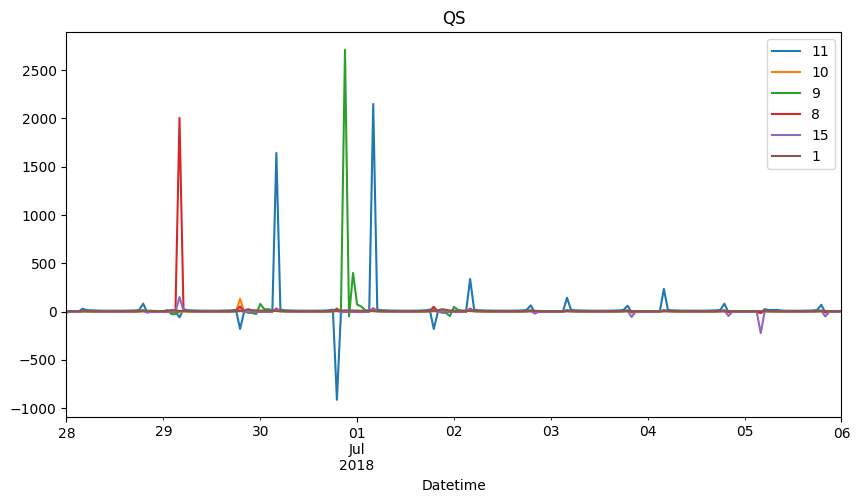

In [94]:
var = 'QS'
df_d = pd.DataFrame()

df_d[11] = diff.loc[11,var]
df_d[10] = diff.loc[10,var]
df_d[9] = diff.loc[9,var]
df_d[8] = diff.loc[8,var]
df_d[15] = diff.loc[15,var]
df_d[1] = diff.loc[1,var]

ax = df_d.plot(figsize = (10,5))
ax.set_title(var)

ax.legend()

In [143]:
diff = ((df_suews_alltypo - df_suews_notypo) / df_suews_notypo)
diff.fillna(0,inplace=True)

grid_shp = gpd.read_file('C:/GitHub/SUEWS_DB_Typology_test/GIS/gridKville.shp').set_index('ID')

outlier_dict = {}

for var in ['QS', 'QN', 'QH','QE']:
    for grid in range(1,16):
        outlier_dict[grid] = {'min':{},'max':{}}
        outlier_dict[grid]['min']['f']  = diff.loc[grid,var].min()
        outlier_dict[grid]['max']['f']  = diff.loc[grid,var].max()

        # print('min grid ' + str(grid) +': ' + str(diff.loc[grid,var].min()))

        q_low = diff.loc[grid,var].quantile(0.01)
        q_hi  = diff.loc[grid,var].quantile(0.99)

        df_filtered = diff.loc[grid][(diff.loc[grid,var] < q_hi) & (diff.loc[grid,var]> q_low)]

        outlier_dict[grid]['min']['e']  = df_filtered[var].min()
        outlier_dict[grid]['max']['e']  = df_filtered[var].max()


        grid_shp.loc[grid,var] = df_filtered[var].mean()
        grid_shp.loc[grid,var+'_day'] = df_filtered[var].between_time('06:00', '18:00').mean()
        grid_shp.loc[grid, var + '_night'] = df_filtered[var].between_time('18:00', '06:00').mean()


grid_shp.fillna(0, inplace = True)


diff = df_suews_alltypo - df_suews_notypo

grid_shp_v = gpd.read_file('C:/GitHub/SUEWS_DB_Typology_test/GIS/gridKville.shp').set_index('ID')

outlier_dict = {}

for var in ['QS', 'QN', 'QH','QE']:
    for grid in range(1,16):
    
        grid_shp_v.loc[grid,var] = diff.loc[grid,var].mean()
        grid_shp_v.loc[grid,var+'_day'] = diff.loc[grid,var].between_time('06:00', '18:00').mean()
        grid_shp_v.loc[grid, var + '_night'] = diff.loc[grid,var].between_time('18:00', '06:00').mean()


NameError: name 'p2s' is not defined

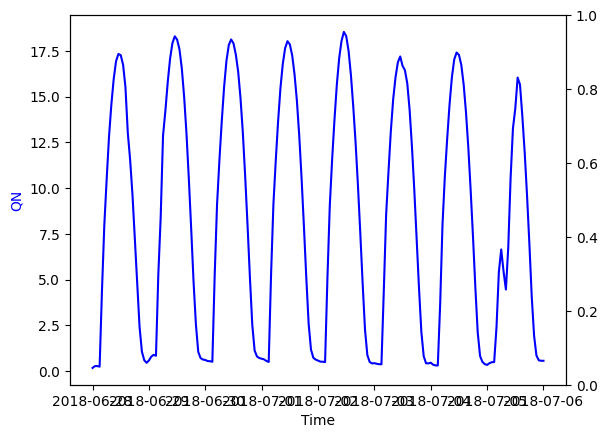

In [96]:
# df_suews_alltypo.loc[15,'QN'].plot()
# df_suews_notypo.loc[15,'QN'].plot()

# diff.loc[15,'QN'].plot()

# df_forcing.loc[p2s:p2e,'kdown'].plot()

fig, ax1 = plt.subplots()

ax1.plot(diff.loc[15, 'QN'], color='b')
ax1.set_xlabel('Time')
ax1.set_ylabel('QN', color='b')

# Create a second y-axis for 'kdown' from 'df_forcing'
ax2 = ax1.twinx()
ax2.plot(df_forcing.loc[p2s:p2e, 'kdown'], color='r')
ax2.set_ylabel('kdown', color='r')


# 3, 4, 5, 6, 8, 10,11, 12, 15

Text(0.5, 1.0, 'QS')

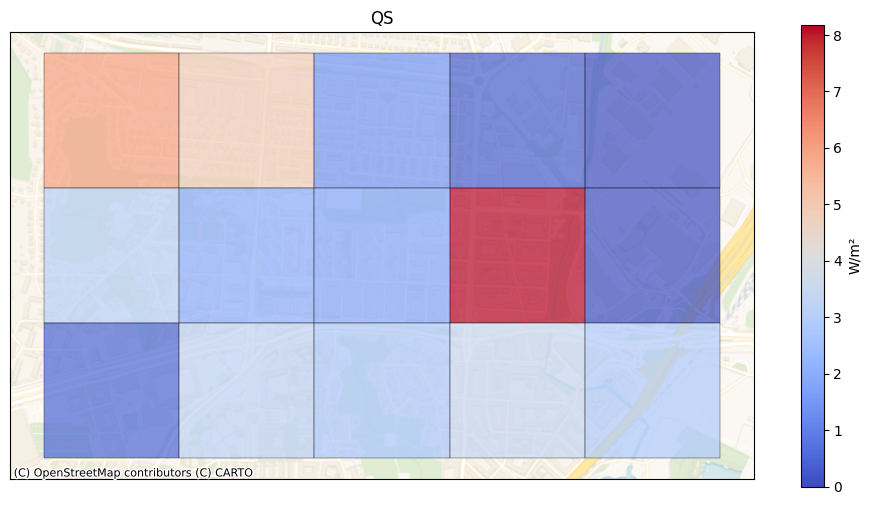

In [27]:
var = 'QS'

ax = grid_shp.plot(column = var, alpha = 0.7, edgecolor="k", linewidth=.35, cmap = 'coolwarm', figsize = (12,6))
cx.add_basemap(ax, crs=grid_shp.crs,  source=cx.providers.CartoDB.VoyagerNoLabels)
ax.set_xticks([]);
ax.set_yticks([]);
# Customize the legend

# Add a colorbar with the unit
sm = plt.cm.ScalarMappable(cmap='coolwarm', norm=plt.Normalize(vmin=grid_shp[var].min(), vmax=grid_shp[var].max()))
sm._A = []  # Dummy array for the scalar mappable
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('W/m²')

ax.set_title(var)

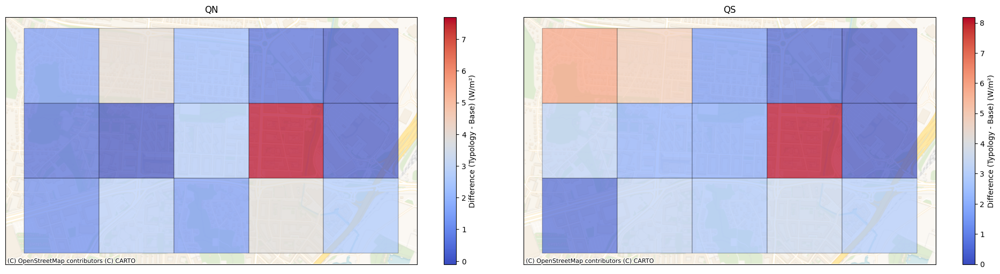

In [13]:
fig, ax = plt.subplots(1, 2, figsize=(20,5))

for var, axs in zip(['QN', 'QS'], [0, 1]):
    grid_shp.plot(column = var, alpha = 0.7, edgecolor="k", linewidth=.35, cmap = 'coolwarm', ax = ax[axs])
    cx.add_basemap(ax[axs], crs=grid_shp.crs,  source=cx.providers.CartoDB.VoyagerNoLabels)
    ax[axs].set_xticks([]);
    ax[axs].set_yticks([]);
    # Customize the legend

    # Add a colorbar with the unit
    sm = plt.cm.ScalarMappable(cmap='coolwarm', norm=plt.Normalize(vmin=grid_shp[var].min(), vmax=grid_shp[var].max()))
    sm._A = []  # Dummy array for the scalar mappable
    cbar = plt.colorbar(sm, ax=ax[axs])
    cbar.set_label('Difference (Typology - Base) (W/m²)')

    ax[axs].set_title(var)
        
plt.tight_layout()
plt.show()



<Axes: >

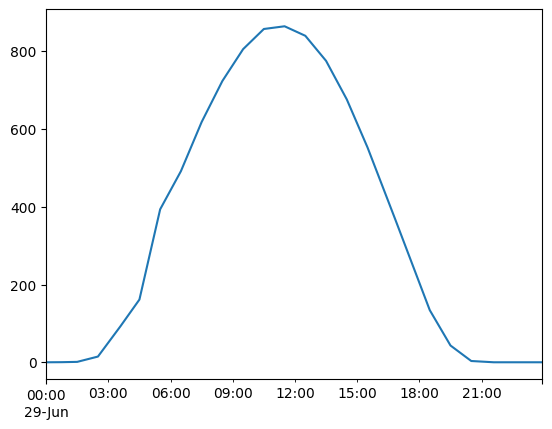

In [14]:
df_forcing.loc['2018-06-29','kdown'].plot()

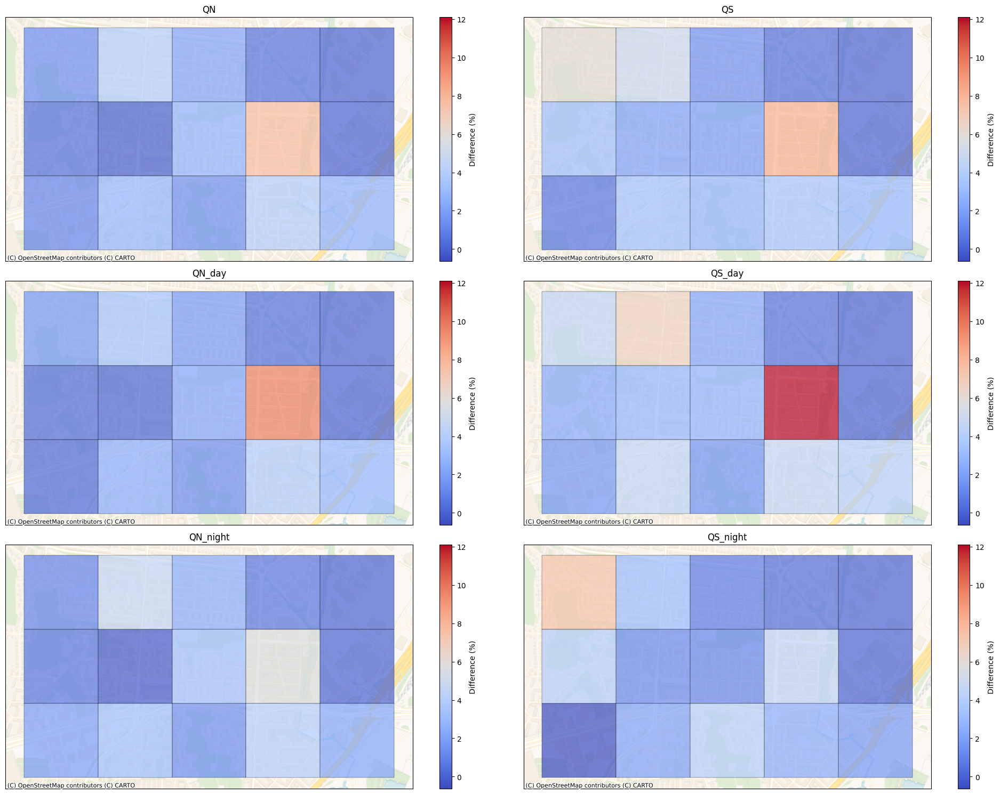

In [15]:
# Calculate global min and max for the variables
variables = ['QN', 'QS', 'QN_day', 'QS_day', 'QN_night', 'QS_night']
vmin = min(grid_shp[variables].min())
vmax = max(grid_shp[variables].max())

colormap = 'coolwarm'

fig, ax = plt.subplots(3, 2, figsize=(20, 15))

for row, time in zip([0, 1, 2], ['', '_day', '_night']):
    for var, col in zip(['QN', 'QS'], [0, 1]):
        var = var + time
        grid_shp.plot(column=var, alpha=0.7, edgecolor="k", linewidth=.35, cmap=colormap, ax=ax[row, col], vmin=vmin, vmax=vmax)
        cx.add_basemap(ax[row, col], crs=grid_shp.crs, source=cx.providers.CartoDB.VoyagerNoLabels)
        ax[row, col].set_xticks([])
        ax[row, col].set_yticks([])

        # Add a colorbar with the unit
        sm = plt.cm.ScalarMappable(cmap=colormap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
        sm._A = []  # Dummy array for the scalar mappable
        cbar = plt.colorbar(sm, ax=ax[row, col])
        cbar.set_label('Difference (%)')

        ax[row, col].set_title(var)

plt.tight_layout()

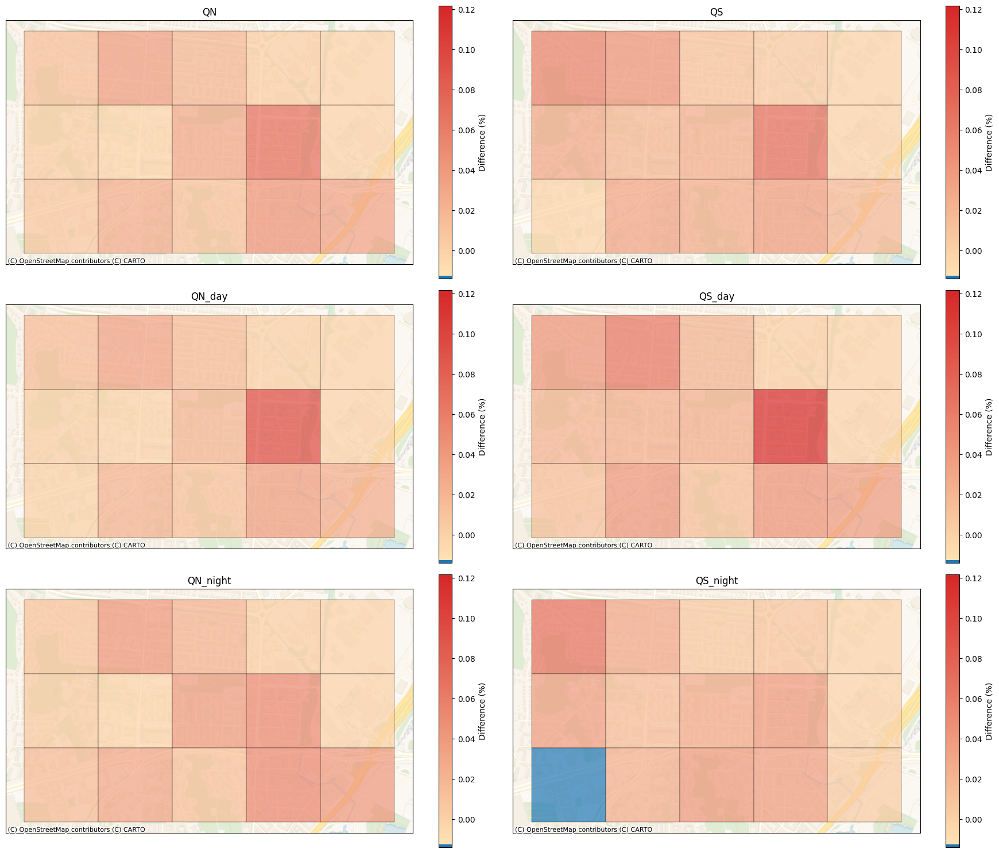

In [144]:
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Calculate global min and max for the variables
variables = ['QN', 'QS', 'QN_day', 'QS_day', 'QN_night', 'QS_night']
vmin = min(grid_shp[variables].min())
vmax = max(grid_shp[variables].max())

# Define a custom colormap
colors = [(0, 'tab:blue'), (0.5, 'moccasin'), (1, 'tab:red')]  # Blue to white to red
n_bins = 100  # Discretizes the interpolation into bins
cmap_name = 'custom_cmap'
custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

# Normalize the colormap to start red at 0
norm = plt.Normalize(vmin=vmin, vmax=vmax)
normed_value = norm(vmin)  # Normalize the value 0 to the range [0, 1] 
colors = [(0, 'tab:blue'), (normed_value, 'moccasin'), (1, 'tab:red')]  # Blue to white to red
custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

fig, ax = plt.subplots(3, 2, figsize=(18, 15))

for row, time in zip([0, 1, 2], ['', '_day', '_night']):
    for var, col in zip(['QN', 'QS'], [0, 1]):
        var = var + time
        grid_shp.plot(column=var, alpha=0.7, edgecolor="k", linewidth=.35, cmap=custom_cmap, ax=ax[row, col], vmin=vmin, vmax=vmax)
        cx.add_basemap(ax[row, col], crs=grid_shp.crs, source=cx.providers.CartoDB.VoyagerNoLabels)
        ax[row, col].set_xticks([])
        ax[row, col].set_yticks([])

        # Add a colorbar with the unit
        sm = plt.cm.ScalarMappable(cmap=custom_cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
        sm._A = []  # Dummy array for the scalar mappable
        cbar = plt.colorbar(sm, ax=ax[row, col])
        cbar.set_label('Difference (%)')

        ax[row, col].set_title(var)

plt.tight_layout()

In [104]:
vmin

-1.3932023934996576

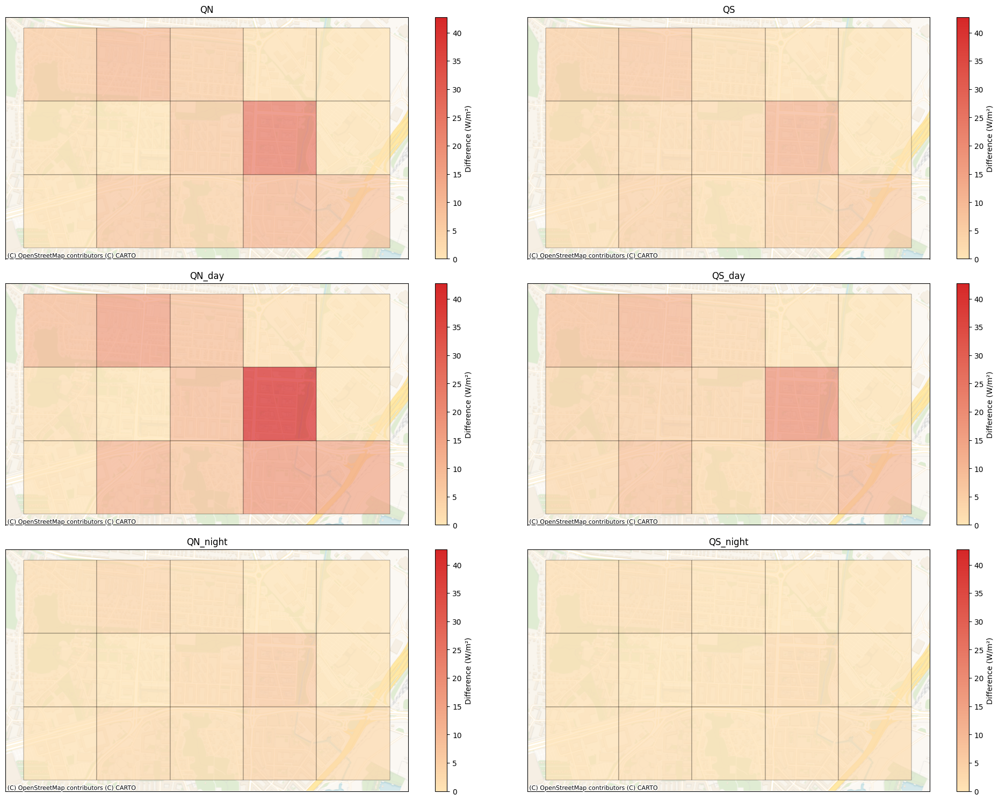

In [17]:


# Calculate global min and max for the variables
variables = ['QN', 'QS', 'QN_day', 'QS_day', 'QN_night', 'QS_night']
vmin = min(grid_shp_v[variables].min())
vmax = max(grid_shp_v[variables].max())

# Define a custom colormap
colors = [(0, 'moccasin'), (0.5, 'moccasin'), (1, 'tab:red')]  # Blue to white to red
n_bins = 100  # Discretizes the interpolation into bins
cmap_name = 'custom_cmap'
custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

# Normalize the colormap to start red at 0
norm = plt.Normalize(vmin=vmin, vmax=vmax)
normed_value = norm(0)  # Normalize the value 0 to the range [0, 1]
colors = [(0, 'moccasin'), (normed_value, 'moccasin'), (1, 'tab:red')]  # Blue to white to red
custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

fig, ax = plt.subplots(3, 2, figsize=(20, 15))

for row, time in zip([0, 1, 2], ['', '_day', '_night']):
    for var, col in zip(['QN', 'QS'], [0, 1]):
        var = var + time
        grid_shp_v.plot(column=var, alpha=0.7, edgecolor="k", linewidth=.35, cmap=custom_cmap, ax=ax[row, col], vmin=vmin, vmax=vmax)
        cx.add_basemap(ax[row, col], crs=grid_shp_v.crs, source=cx.providers.CartoDB.VoyagerNoLabels)
        ax[row, col].set_xticks([])
        ax[row, col].set_yticks([])

        # Add a colorbar with the unit
        sm = plt.cm.ScalarMappable(cmap=custom_cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
        sm._A = []  # Dummy array for the scalar mappable
        cbar = plt.colorbar(sm, ax=ax[row, col])
        cbar.set_label('Difference (W/m²)')

        ax[row, col].set_title(var)

plt.tight_layout()

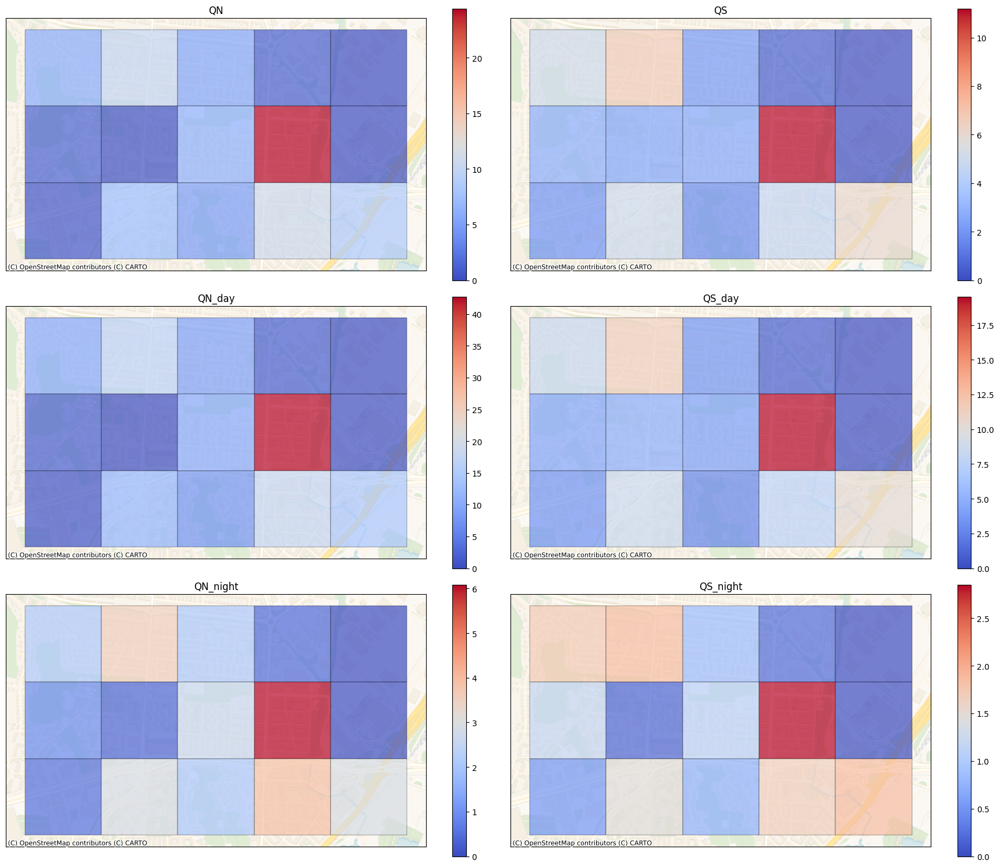

In [18]:
# Calculate global min and max for the variables
variables = ['QN', 'QS', 'QN_day', 'QS_day', 'QN_night', 'QS_night']
vmin = min(grid_shp_v[variables].min())
vmax = max(grid_shp_v[variables].max())

colormap = 'coolwarm'

fig, ax = plt.subplots(3, 2, figsize=(18, 15))

for row, time in zip([0, 1, 2], ['', '_day', '_night']):
    for var, col in zip(['QN', 'QS'], [0, 1]):
        var = var + time
        grid_shp_v.plot(column=var, alpha=0.7, edgecolor="k", linewidth=.35, cmap=colormap, ax=ax[row, col], legend = True)
        cx.add_basemap(ax[row, col], crs=grid_shp_v.crs, source=cx.providers.CartoDB.VoyagerNoLabels)
        ax[row, col].set_xticks([])
        ax[row, col].set_yticks([])

        # Add a colorbar with the unit
        # sm = plt.cm.ScalarMappable(cmap=colormap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
        # sm._A = []  # Dummy array for the scalar mappable
        # cbar = plt.colorbar(sm, ax=ax[row, col])
        # legend.set_label('Difference (%)')

        ax[row, col].set_title(var)

plt.tight_layout()
plt.show()

In [351]:
grid_shp_v

,left,top,right,bottom,_popsum,_popdens,geometry,QS,QS_day,QS_night,QN,QN_day,QN_night,QH,QH_day,QH_night,QE,QE_day,QE_night
ID,,,,,,,,,,,,,,,,,,,
1,145638.0,6400878.0,146038.0,6400478.0,687.0,42.938,"POLYGON ((145479.776 6400990.076, 145879.776 6...",5.058510,8.371329,1.746067,5.906569,9.722927,2.101912,0.797611,1.273911,0.332342,0.050448,0.077687,0.023503
2,145638.0,6400478.0,146038.0,6400078.0,840.0,52.500,"POLYGON ((145479.776 6400590.076, 145879.776 6...",2.768364,4.329849,1.203787,1.215847,1.541977,0.892568,-1.502005,-2.684319,-0.313858,-0.050512,-0.103554,0.002639
3,145638.0,6400078.0,146038.0,6399678.0,1457.0,91.063,"POLYGON ((145479.776 6400190.076, 145879.776 6...",1.936002,3.316282,0.552809,0.569158,0.642735,0.496658,-1.315158,-2.579175,-0.047339,-0.051685,-0.094372,-0.008812
4,146038.0,6400878.0,146438.0,6400478.0,1718.0,107.375,"POLYGON ((145879.776 6400990.076, 146279.776 6...",6.756776,11.565268,1.950483,10.059195,16.587733,3.550069,3.163038,4.812164,1.530248,0.139381,0.210302,0.069338
5,146038.0,6400478.0,146438.0,6400078.0,1496.0,93.500,"POLYGON ((145879.776 6400590.076, 146279.776 6...",2.630349,4.988033,0.265961,0.231161,0.095301,0.369080,-2.318087,-4.737851,0.110098,-0.081101,-0.154880,-0.006979
6,146038.0,6400078.0,146438.0,6399678.0,2077.0,129.813,"POLYGON ((145879.776 6400190.076, 146279.776 6...",5.065168,8.590825,1.532099,7.096843,11.347209,2.857317,1.952371,2.646314,1.275951,0.079304,0.110071,0.049267
7,146438.0,6400878.0,146838.0,6400478.0,975.0,60.938,"POLYGON ((146279.776 6400990.076, 146679.776 6...",2.123960,3.427024,0.826106,5.422103,8.787883,2.069866,3.160492,5.136559,1.192458,0.137650,0.224300,0.051302
8,146438.0,6400478.0,146838.0,6400078.0,2207.0,137.938,"POLYGON ((146279.776 6400590.076, 146679.776 6...",2.482578,3.914288,1.057401,6.117374,9.683340,2.567184,3.484240,5.528766,1.448555,0.150556,0.240286,0.061228
9,146438.0,6400078.0,146838.0,6399678.0,1498.0,93.625,"POLYGON ((146279.776 6400190.076, 146679.776 6...",1.649263,2.583246,0.718928,4.676979,7.339230,2.023675,2.909054,4.562959,1.260464,0.118663,0.193025,0.044283


In [ ]:
    # grid_shp_v.loc[grid,var] = diff.loc[grid,var].mean()
    # grid_shp_v.loc[grid,var+'_day'] = diff.loc[grid,var].between_time('06:00', '18:00').mean()
    # grid_shp_v.loc[grid, var + '_night'] = diff.loc[grid,var].between_time('18:00', '06:00').mean()

NameError: name 'grid_v' is not defined

In [175]:
diff = ((df_suews_alltypo - df_suews_notypo) / df_suews_notypo) *100

df_t = pd.DataFrame()

for i in range(1,16):
    df_t.loc[i, 'QN'] = outlier(diff, 'QN').loc[i,'QN'].mean()
    df_t.loc[i, 'QS'] = outlier(diff, 'QS').loc[i,'QS'].mean()
    df_t.loc[i, 'QN_day'] = outlier(diff, 'QN').loc[i,'QN'].between_time('06:00', '18:00').mean()
    df_t.loc[i, 'QS_day'] = outlier(diff, 'QS').loc[i,'QS'].between_time('06:00', '18:00').mean()
    df_t.loc[i, 'QN_night'] = outlier(diff, 'QN').loc[i,'QN'].between_time('18:00', '06:00').mean()
    df_t.loc[i, 'QS_night'] = outlier(diff, 'QS').loc[i,'QS'].between_time('18:00', '06:00').mean()
    # df_t.loc[i, 'QH'] = diff.loc[i,'QH'].mean()
    
df_t.T


,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
QN,1.328021,0.399960,1.033784,3.964758,-0.202677,2.975184,2.169630,2.370605,1.330567,0.487933,7.708348,3.726482,0.0,0.0,3.107995
QS,6.130164,3.135651,0.690446,4.586571,2.139966,3.092945,1.334556,1.710601,2.239584,0.712181,7.870751,3.125810,0.0,0.0,2.765445
QN_day,1.673085,0.265549,0.146649,3.514259,0.047154,2.484283,1.842147,2.211389,1.338577,0.359966,9.875467,3.956647,0.0,0.0,2.913407
QS_day,4.575385,2.281457,1.569080,6.722783,2.716669,4.463377,2.203248,2.711560,1.551771,0.421960,12.192641,4.644936,0.0,0.0,4.101836
QN_night,1.092674,0.532051,1.816924,4.552716,-0.399249,3.598419,2.548321,2.689355,1.381003,0.624072,6.178952,3.771592,0.0,0.0,3.411131
QS_night,7.567357,3.894789,-0.019768,3.132066,1.751125,2.141171,0.792350,1.122637,2.966239,1.016802,4.803652,2.220775,0.0,0.0,1.830098


In [13]:
def outlier (df, var):

    q_low = df[var].quantile(0.01)
    q_hi  = df[var].quantile(0.99)

    df_filtered = df[(df[var] < q_hi) & (df[var] > q_low)]
    
    return df_filtered

outlier(diff, 'QS')['QS'].plot()

diff['QS'].plot()

NameError: name 'diff' is not defined

In [160]:
df_filtered

,Dectime,Kdown,Kup,Ldown,Lup,Tsurf,QN,QF,QS,QH,...,MeltWater,MeltWStore,SnowCh,SnowRPaved,SnowRBldgs,Ts,T2,Q2,U10,RH2
Datetime,,,,,,,,,,,,,,,,,,,,,
2018-06-28 00:00:00,0.0,0.0,0.000000,0.0,-0.000499,0.002500,0.003680,0.0,-0.075161,0.005927,...,0.0,0.0,0.0,0.0,0.0,0.001233,0.000145,-0.000050,0.000000,-0.000217
2018-06-28 01:00:00,0.0,0.0,39.471795,0.0,-0.000780,0.001946,0.006202,0.0,-0.034508,0.003328,...,0.0,0.0,0.0,0.0,0.0,0.000723,0.000084,-0.000051,0.000000,-0.000151
2018-06-28 03:00:00,0.0,0.0,0.030825,0.0,-0.000708,0.001826,0.005186,0.0,-0.047192,0.002658,...,0.0,0.0,0.0,0.0,0.0,0.000596,0.000073,-0.000044,0.000000,-0.000125
2018-06-28 04:00:00,0.0,0.0,-0.485166,0.0,-0.000384,-0.005143,0.041453,0.0,0.094035,0.021882,...,0.0,0.0,0.0,0.0,0.0,0.005109,0.000685,-0.000034,0.000000,-0.000826
2018-06-28 05:00:00,0.0,0.0,-0.243862,0.0,-0.000883,-0.010584,0.038312,0.0,0.059301,0.024620,...,0.0,0.0,0.0,0.0,0.0,0.007951,0.001112,-0.000025,0.000000,-0.001418
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-07-05 20:00:00,0.0,0.0,-0.226785,0.0,-0.001964,0.000162,0.041572,0.0,-0.338361,0.013339,...,0.0,0.0,0.0,0.0,0.0,0.001320,0.000054,-0.000021,0.004918,-0.000082
2018-07-05 21:00:00,0.0,0.0,-0.263982,0.0,-0.001801,0.000938,0.036306,0.0,-0.029122,0.009777,...,0.0,0.0,0.0,0.0,0.0,0.000922,0.000045,-0.000010,0.002854,-0.000066
2018-07-05 22:00:00,0.0,0.0,2.356022,0.0,-0.001658,0.002155,0.029143,0.0,-0.016039,0.008955,...,0.0,0.0,0.0,0.0,0.0,0.000887,0.000052,-0.000011,0.000648,-0.000075


In [158]:
grid_shp

,left,top,right,bottom,_popsum,_popdens,geometry,QS,QS_day,QS_night,QN,QN_day,QN_night,QH,QH_day,QH_night,QE,QE_day,QE_night
ID,,,,,,,,,,,,,,,,,,,
1,145638.0,6400878.0,146038.0,6400478.0,687.0,42.938,"POLYGON ((145479.776 6400990.076, 145879.776 6...",0.058882,0.045828,0.071386,0.013268,0.016731,0.010811,0.002409,0.004126,0.001347,0.001637,0.002160,0.001293
2,145638.0,6400478.0,146038.0,6400078.0,840.0,52.500,"POLYGON ((145479.776 6400590.076, 145879.776 6...",0.031107,0.022832,0.038608,0.003974,0.002674,0.005254,-0.003922,-0.006049,-0.001901,-0.000507,-0.001868,0.000790
3,145638.0,6400078.0,146038.0,6399678.0,1457.0,91.063,"POLYGON ((145479.776 6400190.076, 145879.776 6...",-0.000435,0.015691,-0.013932,0.010389,0.001475,0.018169,-0.002887,-0.008108,0.001749,-0.001200,-0.002824,0.000338
4,146038.0,6400878.0,146438.0,6400478.0,1718.0,107.375,"POLYGON ((145879.776 6400990.076, 146279.776 6...",0.045866,0.067228,0.031321,0.038423,0.035143,0.043177,0.017329,0.018185,0.018145,0.005961,0.007118,0.005349
5,146038.0,6400478.0,146438.0,6400078.0,1496.0,93.500,"POLYGON ((145879.776 6400590.076, 146279.776 6...",0.020731,0.027167,0.016182,-0.000409,0.000472,-0.000946,-0.000677,-0.015714,0.012475,-0.001311,-0.005360,0.002414
6,146038.0,6400078.0,146438.0,6399678.0,2077.0,129.813,"POLYGON ((145879.776 6400190.076, 146279.776 6...",0.034473,0.044634,0.028043,0.028616,0.024843,0.033426,0.014627,0.011789,0.018565,0.004683,0.004441,0.005196
7,146438.0,6400878.0,146838.0,6400478.0,975.0,60.938,"POLYGON ((146279.776 6400990.076, 146679.776 6...",0.012725,0.022032,0.006601,0.020752,0.018421,0.023866,0.014604,0.017272,0.013113,0.005266,0.006834,0.003998
8,146438.0,6400478.0,146838.0,6400078.0,2207.0,137.938,"POLYGON ((146279.776 6400590.076, 146679.776 6...",0.027066,0.027116,0.030039,0.031058,0.022114,0.040461,0.018570,0.019467,0.018904,0.006197,0.007596,0.005202
9,146438.0,6400078.0,146838.0,6399678.0,1498.0,93.625,"POLYGON ((146279.776 6400190.076, 146679.776 6...",0.029431,0.015518,0.042540,0.013279,0.013386,0.013780,0.011185,0.012698,0.010352,0.004355,0.004921,0.003910


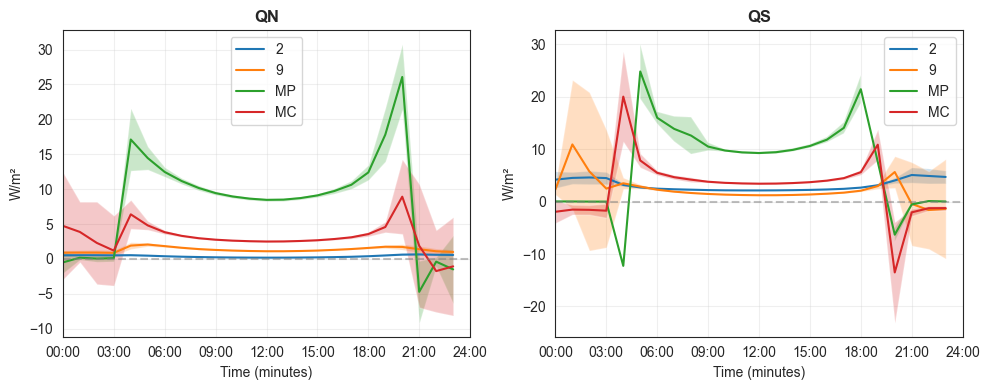

In [181]:
sns.set_style("white")

fig, ax = plt.subplots(1, 2, figsize=(10, 4))
grid_name_dict = {
    2: '2',
    9: '9',
    11: 'MP',
    15: 'MC',
}

for var, axs in zip(['QN', 'QS'], [0, 1]):
    # Filter data for loc 11, 12, and 13
    for grid in list(grid_name_dict.keys()):
        # Resample to 5-minute means
        five_minute_means = outlier(diff, var).loc[grid].resample('60min').mean()

        # Ensure the time index is properly formatted
        five_minute_means['time'] = five_minute_means.index.strftime('%H:%M')
        five_minute_means['time'] = pd.to_datetime(five_minute_means['time'], format='%H:%M')

        # Calculate the mean and standard deviation for each 5-minute interval
        diurnal_mean = five_minute_means.groupby(five_minute_means['time'].dt.time).mean()
        diurnal_std = five_minute_means.groupby(five_minute_means['time'].dt.time).std()

        # Convert time to numeric format for plotting
        diurnal_mean['time_numeric'] = diurnal_mean.index.map(lambda t: t.hour * 60 + t.minute)
        diurnal_std['time_numeric'] = diurnal_std.index.map(lambda t: t.hour * 60 + t.minute)

        # Plotting
        sns.lineplot(x=diurnal_mean['time_numeric'], y=diurnal_mean[var], label=f'{grid_name_dict[grid]}', ax=ax[axs])
        ax[axs].fill_between(diurnal_mean['time_numeric'], diurnal_mean[var] - diurnal_std[var], diurnal_mean[var] + diurnal_std[var], alpha=0.25)
        ax[axs].set_title(var, fontweight='bold')

for i in [0, 1]:
    ax[i].set_xlim(0, 1440)  # 1440 minutes in a day
    ax[i].set_xlabel('Time (minutes)')
    ax[i].set_ylabel('W/m²')
    ax[i].legend()
    ax[i].axhline(0, color='grey', linestyle='--', alpha=0.5)
    ax[i].set_xticks([0, 180, 360, 540, 720, 900, 1080, 1260, 1440])
    ax[i].set_xticklabels(['00:00', '03:00', '06:00', '09:00', '12:00', '15:00', '18:00', '21:00', '24:00'])
    ax[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


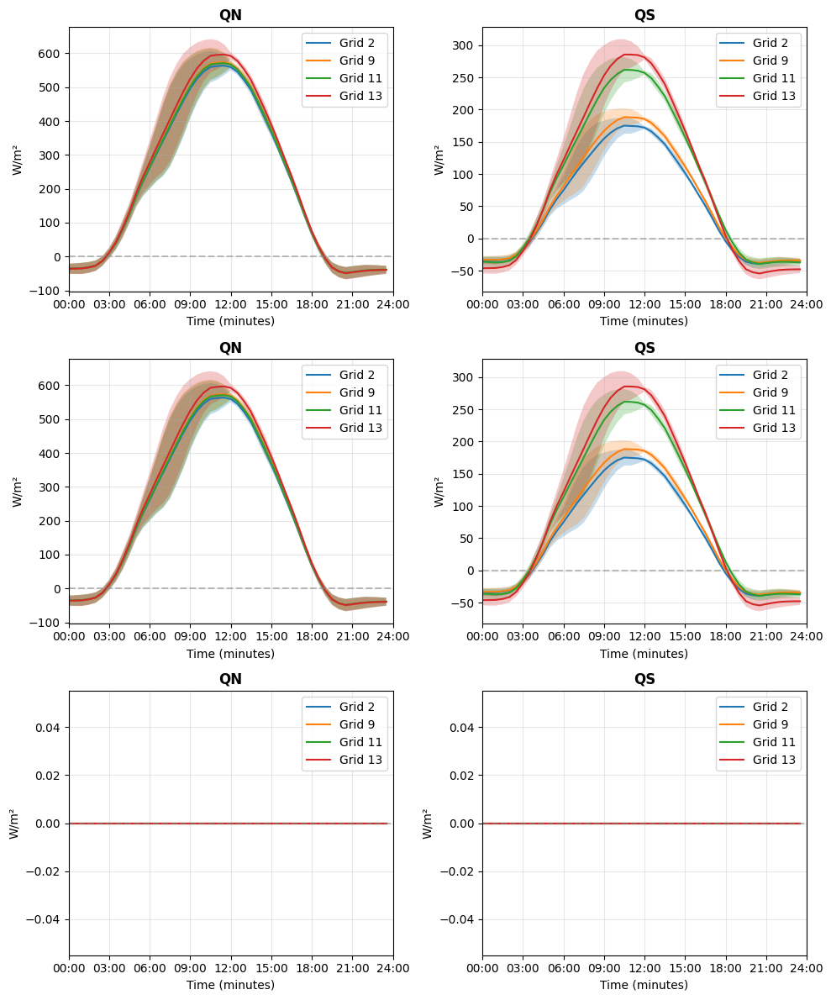

In [34]:
fig, ax = plt.subplots(3, 2, figsize=(10, 12))  # Adjusted to 3 rows and 2 columns

diff2 = df_suews_alltypo - df_suews_notypo

grids = [2, 9, 11, 13]
# Define the different datasets
datasets = ['notypo', 'alltypo', 'outlier(diff, var)']

for row, dataset in enumerate(datasets):
    for var, axs in zip(['QN', 'QS'], [0, 1]):
        for grid in grids:
            # Resample to 30-minute means
            if dataset == 'notypo':
                five_minute_means = df_suews_notypo.loc[grid].resample('30min').mean()
            elif dataset == 'alltypo':
                five_minute_means = df_suews_alltypo.loc[grid].resample('30min').mean()
            else:
                five_minute_means = diff2.loc[grid].resample('30min').mean()

            # Ensure the time index is properly formatted
            five_minute_means['time'] = five_minute_means.index.strftime('%H:%M')
            five_minute_means['time'] = pd.to_datetime(five_minute_means['time'], format='%H:%M')

            # Calculate the mean and standard deviation for each 30-minute interval
            diurnal_mean = five_minute_means.groupby(five_minute_means['time'].dt.time).mean()
            diurnal_std = five_minute_means.groupby(five_minute_means['time'].dt.time).std()

            # Convert time to numeric format for plotting
            diurnal_mean['time_numeric'] = diurnal_mean.index.map(lambda t: t.hour * 60 + t.minute)
            diurnal_std['time_numeric'] = diurnal_std.index.map(lambda t: t.hour * 60 + t.minute)

            # Plotting
            sns.lineplot(x=diurnal_mean['time_numeric'], y=diurnal_mean[var], label=f'Grid {grid}', ax=ax[row, axs])
            ax[row, axs].fill_between(diurnal_mean['time_numeric'], diurnal_mean[var] - diurnal_std[var], diurnal_mean[var] + diurnal_std[var], alpha=0.25)
            ax[row, axs].set_title(var, fontweight='bold')

for i in range(3):
    for j in [0, 1]:
        ax[i, j].set_xlim(0, 1440)  # 1440 minutes in a day
        ax[i, j].set_xlabel('Time (minutes)')
        ax[i, j].set_ylabel('W/m²')
        ax[i, j].legend()
        ax[i, j].axhline(0, color='grey', linestyle='--', alpha=0.5)
        ax[i, j].set_xticks([0, 180, 360, 540, 720, 900, 1080, 1260, 1440])
        ax[i, j].set_xticklabels(['00:00', '03:00', '06:00', '09:00', '12:00', '15:00', '18:00', '21:00', '24:00'])
        ax[i, j].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()



In [ ]:
fig, ax = plt.subplots(3, 2, figsize=(10, 12))  # Adjusted to 3 rows and 2 columns

diff2 = df_suews_alltypo - df_suews_notypo

grids = [2, 9, 11, 13]
# Define the different datasets
datasets = ['notypo', 'alltypo', 'outlier(diff, var)']

for row, dataset in enumerate(datasets):
    for var, axs in zip(['QH', 'QS'], [0, 1]):
        for grid in grids:
            # Resample to 30-minute means
            if dataset == 'notypo':
                five_minute_means = df_suews_notypo.loc[grid].resample('30min').mean()
            elif dataset == 'alltypo':
                five_minute_means = df_suews_alltypo.loc[grid].resample('30min').mean()
            else:
                five_minute_means = diff2.loc[grid].resample('30min').mean()

            # Ensure the time index is properly formatted
            five_minute_means['time'] = five_minute_means.index.strftime('%H:%M')
            five_minute_means['time'] = pd.to_datetime(five_minute_means['time'], format='%H:%M')

            # Calculate the mean and standard deviation for each 30-minute interval
            diurnal_mean = five_minute_means.groupby(five_minute_means['time'].dt.time).mean()
            diurnal_std = five_minute_means.groupby(five_minute_means['time'].dt.time).std()

            # Convert time to numeric format for plotting
            diurnal_mean['time_numeric'] = diurnal_mean.index.map(lambda t: t.hour * 60 + t.minute)
            diurnal_std['time_numeric'] = diurnal_std.index.map(lambda t: t.hour * 60 + t.minute)

            # Plotting
            sns.lineplot(x=diurnal_mean['time_numeric'], y=diurnal_mean[var], label=f'Grid {grid}', ax=ax[row, axs])
            ax[row, axs].fill_between(diurnal_mean['time_numeric'], diurnal_mean[var] - diurnal_std[var], diurnal_mean[var] + diurnal_std[var], alpha=0.25)
            ax[row, axs].set_title(var, fontweight='bold')

for i in range(3):
    for j in [0, 1]:
        ax[i, j].set_xlim(0, 1440)  # 1440 minutes in a day
        ax[i, j].set_xlabel('Time (minutes)')
        ax[i, j].set_ylabel('W/m²')
        ax[i, j].legend()
        ax[i, j].axhline(0, color='grey', linestyle='--', alpha=0.5)
        ax[i, j].set_xticks([0, 180, 360, 540, 720, 900, 1080, 1260, 1440])
        ax[i, j].set_xticklabels(['00:00', '03:00', '06:00', '09:00', '12:00', '15:00', '18:00', '21:00', '24:00'])
        ax[i, j].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()



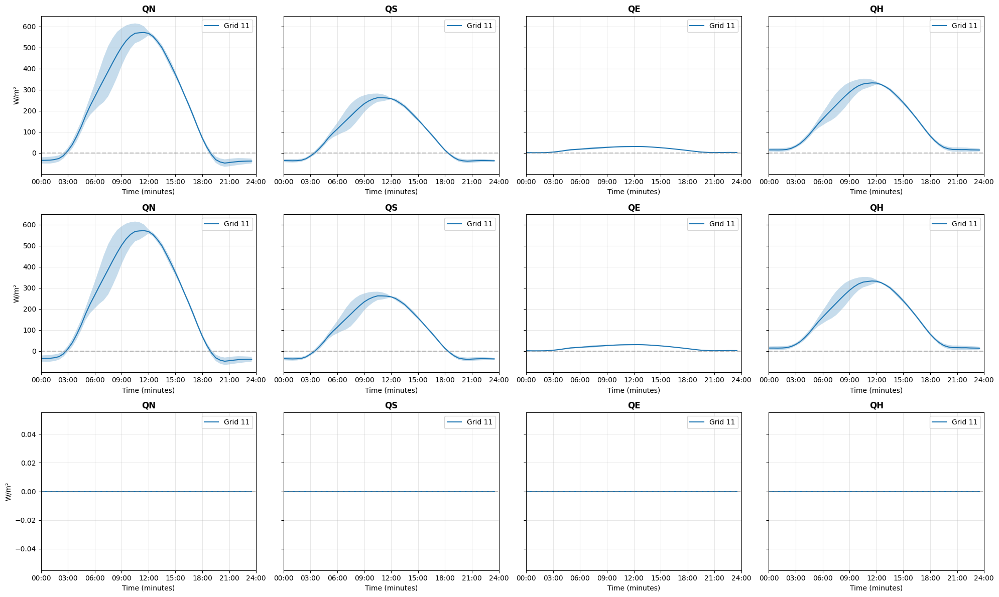

In [32]:
fig, ax = plt.subplots(3, 4, figsize=(20, 12), sharey='row')  # Adjusted to 3 rows and 4 columns with shared y-axis for rows 1 and 2

grids = [11]
# Define the different datasets
datasets = ['notypo', 'alltypo', 'outlier(diff, var)']

# Define the variables to plot
variables = ['QN', 'QS', 'QE', 'QH']

for row, dataset in enumerate(datasets):
    for var, axs in zip(variables, range(4)):
        for grid in grids:
            # Resample to 30-minute means
            if dataset == 'notypo':
                five_minute_means = df_suews_notypo.loc[grid].resample('30min').mean()
            elif dataset == 'alltypo':
                five_minute_means = df_suews_alltypo.loc[grid].resample('30min').mean()
            else:
                five_minute_means = diff2.loc[grid].resample('30min').mean()

            # Ensure the time index is properly formatted
            five_minute_means['time'] = five_minute_means.index.strftime('%H:%M')
            five_minute_means['time'] = pd.to_datetime(five_minute_means['time'], format='%H:%M')

            # Calculate the mean and standard deviation for each 30-minute interval
            diurnal_mean = five_minute_means.groupby(five_minute_means['time'].dt.time).mean()
            diurnal_std = five_minute_means.groupby(five_minute_means['time'].dt.time).std()

            # Convert time to numeric format for plotting
            diurnal_mean['time_numeric'] = diurnal_mean.index.map(lambda t: t.hour * 60 + t.minute)
            diurnal_std['time_numeric'] = diurnal_std.index.map(lambda t: t.hour * 60 + t.minute)

            # Plotting
            sns.lineplot(x=diurnal_mean['time_numeric'], y=diurnal_mean[var], label=f'Grid {grid}', ax=ax[row, axs])
            ax[row, axs].fill_between(diurnal_mean['time_numeric'], diurnal_mean[var] - diurnal_std[var], diurnal_mean[var] + diurnal_std[var], alpha=0.25)
            ax[row, axs].set_title(var, fontweight='bold')

for i in range(3):
    for j in range(4):
        ax[i, j].set_xlim(0, 1440)  # 1440 minutes in a day
        ax[i, j].set_xlabel('Time (minutes)')
        ax[i, j].set_ylabel('W/m²')
        ax[i, j].legend()
        ax[i, j].axhline(0, color='grey', linestyle='--', alpha=0.5)
        ax[i, j].set_xticks([0, 180, 360, 540, 720, 900, 1080, 1260, 1440])
        ax[i, j].set_xticklabels(['00:00', '03:00', '06:00', '09:00', '12:00', '15:00', '18:00', '21:00', '24:00'])
        ax[i, j].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


<Axes: xlabel='grid,datetime'>

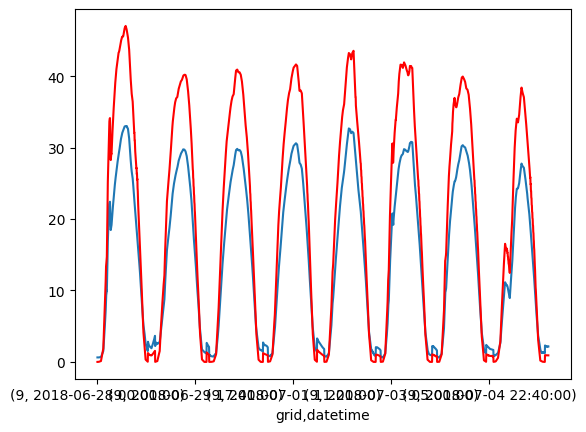

In [31]:
var = 'QE'
ax = df_suews_alltypo.loc[[11], var].plot()
df_suews_alltypo.loc[[9], var].plot(color = 'red', ax = ax)


In [150]:
diff = ((df_suews_alltypo - df_suews_notypo) / df_suews_notypo) *100

df_t = pd.DataFrame()

for i in range(1,16):
    df_t.loc[i, 'QN'] = diff.loc[i,'QN'].mean()
    df_t.loc[i, 'QS'] = diff.loc[i,'QS'].mean()
    df_t.loc[i, 'QN_day'] = diff.loc[i,'QN'].between_time('06:00', '18:00').mean()
    df_t.loc[i, 'QS_day'] = diff.loc[i,'QS'].between_time('06:00', '18:00').mean()
    df_t.loc[i, 'QN_night'] = diff.loc[i,'QN'].between_time('18:00', '06:00').mean()
    df_t.loc[i, 'QS_night'] = diff.loc[i,'QS'].between_time('18:00', '06:00').mean()
    # df_t.loc[i, 'QH'] = diff.loc[i,'QH'].mean()
    
df_t.T


,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
QN,1.328021,0.399960,2.784575,4.049154,1.010717,2.762548,2.169630,7.983377,1.330567,0.362782,5.071334,5.369441,0.0,0.0,4.946029
QS,6.130164,3.135651,-0.785753,3.548742,2.136037,3.143357,1.146194,3.148105,5.008158,-0.828626,9.220426,3.051554,0.0,0.0,0.435474
QN_day,1.673085,0.265549,0.146649,3.514259,0.047154,2.484283,1.842147,2.211389,1.338577,0.359966,9.875467,3.956647,0.0,0.0,2.913407
QS_day,4.575385,2.281457,1.569080,6.722783,2.716669,4.463377,2.203248,2.711560,1.551771,0.421960,12.192641,4.644936,0.0,0.0,4.101836
QN_night,1.092674,0.532051,5.012670,4.679846,1.840445,3.142284,2.548321,12.975809,1.381003,0.392735,1.433828,6.787641,0.0,0.0,6.769404
QS_night,7.567357,3.894789,-2.706107,1.279847,1.751310,2.270091,0.451286,3.804105,7.999777,-1.824052,7.722641,2.136002,0.0,0.0,-2.416978


In [276]:
data = df_state.copy()
data.loc[:, 'netradiationmethod'] = 3 # Spartacus
data.loc[:, 'storageheatmethod'] = 1
data.loc[:, 'roughlenmommethod'] = 2
data.loc[:, 'roughlenheatmethod'] = 2
data.loc[:, 'stabilitymethod'] = 3

data.loc[:, 'ohmincqf'] = 1  # QN

p2s = '2018-06-28'
p2e = '2018-07-05'

df_out, df_final = process_in_chunks(data, df_forcing.loc[p2s:p2e])

3
2025-02-28 13:09:10,084 - SuPy - INFO - ====================
2025-02-28 13:09:10,085 - SuPy - INFO - Simulation period:
2025-02-28 13:09:10,086 - SuPy - INFO -   Start: 2018-06-28 00:00:00
2025-02-28 13:09:10,086 - SuPy - INFO -   End: 2018-07-05 23:00:00
2025-02-28 13:09:10,087 - SuPy - INFO - 
2025-02-28 13:09:10,088 - SuPy - INFO - No. of grids: 5
2025-02-28 13:09:10,089 - SuPy - INFO - SuPy is running in serial mode
2025-02-28 13:09:11,579 - SuPy - INFO - Execution time: 1.5 s
2025-02-28 13:09:11,579 - SuPy - INFO - ====================

2025-02-28 13:09:11,593 - SuPy - INFO - ====================
2025-02-28 13:09:11,593 - SuPy - INFO - Simulation period:
2025-02-28 13:09:11,594 - SuPy - INFO -   Start: 2018-06-28 00:00:00
2025-02-28 13:09:11,595 - SuPy - INFO -   End: 2018-07-05 23:00:00
2025-02-28 13:09:11,595 - SuPy - INFO - 
2025-02-28 13:09:11,596 - SuPy - INFO - No. of grids: 5
2025-02-28 13:09:11,598 - SuPy - INFO - SuPy is running in serial mode
2025-02-28 13:09:13,107 - 

In [290]:
a = df_state.filter(like='cp')

a


var     cpanohm                                                 irrfracpaved  \
ind_dim    (0,)    (1,)    (2,)    (3,)    (4,)    (5,)    (6,)            0   
grid                                                                           
1        1200.0  1200.0  1200.0  1200.0  1200.0  1200.0  1200.0          0.0   
2        1200.0  1200.0  1200.0  1200.0  1200.0  1200.0  1200.0          0.0   
3        1200.0  1200.0  1200.0  1200.0  1200.0  1200.0  1200.0          0.0   
4        1200.0  1200.0  1200.0  1200.0  1200.0  1200.0  1200.0          0.0   
5        1200.0  1200.0  1200.0  1200.0  1200.0  1200.0  1200.0          0.0   
6        1200.0  1200.0  1200.0  1200.0  1200.0  1200.0  1200.0          0.0   
7        1200.0  1200.0  1200.0  1200.0  1200.0  1200.0  1200.0          0.0   
8        1200.0  1200.0  1200.0  1200.0  1200.0  1200.0  1200.0          0.0   
9        1200.0  1200.0  1200.0  1200.0  1200.0  1200.0  1200.0          0.0   
10       1200.0  1200.0  1200.0  1200.0  1200.0  1200.0  1200.0          0.0   
11       1200.0  1200.0  1200.0  1200.0  1200.0  1200.0  1200.0          0.0   
12       1200.0  1200.0  1200.0  1200.0  1200.0  1200.0  1200.0          0.0   
13       1200.0  1200.0  1200.0  1200.0  1200.0  1200.0  1200.0          0.0   
14       1200.0  1200.0  1200.0  1200.0  1200.0  1200.0  1200.0          0.0   
15       1200.0  1200.0  1200.0  1200.0  1200.0  1200.0  1200.0          0.0   

var     wallcp groundfloorcp  ... cp_surf                                  \
ind_dim      0             0  ...  (5, 0)  (5, 1)  (5, 2)  (5, 3)  (5, 4)   
grid                          ...                                           
1        850.0        1500.0  ...  1000.0  1000.0  1000.0  1000.0  1000.0   
2        850.0        1500.0  ...  1000.0  1000.0  1000.0  1000.0  1000.0   
3        850.0        1500.0  ...  1000.0  1000.0  1000.0  1000.0  1000.0   
4        850.0        1500.0  ...  1000.0  1000.0  1000.0  1000.0  1000.0   
5        850.0        1500.0  ...  1000.0  1000.0  1000.0  1000.0  1000.0   
6        850.0        1500.0  ...  1000.0  1000.0  1000.0  1000.0  1000.0   
7        850.0        1500.0  ...  1000.0  1000.0  1000.0  1000.0  1000.0   
8        850.0        1500.0  ...  1000.0  1000.0  1000.0  1000.0  1000.0   
9        850.0        1500.0  ...  1000.0  1000.0  1000.0  1000.0  1000.0   
10       850.0        1500.0  ...  1000.0  1000.0  1000.0  1000.0  1000.0   
11       850.0        1500.0  ...  1000.0  1000.0  1000.0  1000.0  1000.0   
12       850.0        1500.0  ...  1000.0  1000.0  1000.0  1000.0  1000.0   
13       850.0        1500.0  ...  1000.0  1000.0  1000.0  1000.0  1000.0   
14       850.0        1500.0  ...  1000.0  1000.0  1000.0  1000.0  1000.0   
15       850.0        1500.0  ...  1000.0  1000.0  1000.0  1000.0  1000.0   

var                                              
ind_dim  (6, 0)  (6, 1)  (6, 2)  (6, 3)  (6, 4)  
grid                                             
1        1000.0  1000.0  1000.0  1000.0  1000.0  
2        1000.0  1000.0  1000.0  1000.0  1000.0  
3        1000.0  1000.0  1000.0  1000.0  1000.0  
4        1000.0  1000.0  1000.0  1000.0  1000.0  
5        1000.0  1000.0  1000.0  1000.0  1000.0  
6        1000.0  1000.0  1000.0  1000.0  1000.0  
7        1000.0  1000.0  1000.0  1000.0  1000.0  
8        1000.0  1000.0  1000.0  1000.0  1000.0  
9        1000.0  1000.0  1000.0  1000.0  1000.0  
10       1000.0  1000.0  1000.0  1000.0  1000.0  
11       1000.0  1000.0  1000.0  1000.0  1000.0  
12       1000.0  1000.0  1000.0  1000.0  1000.0  
13       1000.0  1000.0  1000.0  1000.0  1000.0  
14       1000.0  1000.0  1000.0  1000.0  1000.0  
15       1000.0  1000.0  1000.0  1000.0  1000.0  

[15 rows x 78 columns]